In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import plotly.figure_factory as ff
from statsmodels.formula.api import ols
import statsmodels.api as sm
import calendar

In [2]:
from sklearn.preprocessing import StandardScaler, MaxAbsScaler, MinMaxScaler, RobustScaler, Normalizer
from sklearn.preprocessing import OneHotEncoder, PolynomialFeatures 
from sklearn.model_selection import train_test_split, cross_validate, cross_val_score, KFold, StratifiedKFold, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, confusion_matrix, make_scorer
from sklearn.decomposition import PCA
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.linear_model import LinearRegression, HuberRegressor
from sklearn.linear_model import PassiveAggressiveRegressor, PoissonRegressor, QuantileRegressor
from sklearn.linear_model import TheilSenRegressor, TweedieRegressor, RANSACRegressor
from sklearn.linear_model import Ridge, Lasso, ElasticNet
from sklearn.linear_model import ARDRegression, BayesianRidge
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, ExtraTreesRegressor, BaggingRegressor 
from sklearn.ensemble import GradientBoostingRegressor, HistGradientBoostingRegressor, VotingRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
import statsmodels.api as sm
import warnings
warnings.filterwarnings(action = "ignore")

In [3]:
# 모델 성능 비교 함수
def regressor_mae(df_X, df_y):
    from sklearn.linear_model import LinearRegression 
    from sklearn.linear_model import Ridge, Lasso, ElasticNet
    from sklearn.linear_model import ARDRegression, BayesianRidge
    from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, AdaBoostRegressor, GradientBoostingRegressor
    from xgboost import XGBRegressor 
    from lightgbm import LGBMRegressor
    from catboost import CatBoostRegressor
    from sklearn.model_selection import cross_val_score 
    from sklearn.svm import SVR
    
    import ast # convert string to function
    import numpy as np
    from tqdm import tqdm
    
    seed = None
    
    linear = LinearRegression()
    ridge, lasso, elasticnet = Ridge(), Lasso(), ElasticNet()
    ardr_linear, baysian_ridge = ARDRegression(), BayesianRidge()
    random_forest, gradient_boost = RandomForestRegressor(random_state = seed), GradientBoostingRegressor(random_state = seed)
    extra_tree, adaboost = ExtraTreesRegressor(random_state = seed), AdaBoostRegressor(random_state = seed)
    xgboost = XGBRegressor(random_state = seed)
    lightgbm = LGBMRegressor(random_state = seed)
    catboost = CatBoostRegressor(verbose = False, random_state = seed)
    svr = SVR()
    
    model_list = ["linear", "ridge", "lasso", "elasticnet",
                  "ardr_linear", "baysian_ridge", 
                  "random_forest", "gradient_boost",
                  "extra_tree", "adaboost",
                  "xgboost", "lightgbm", "catboost",
                  "svr",]
    
    score_dic = dict()
    for model_nm in tqdm(model_list):
        scores = cross_val_score(eval(model_nm), df_X, df_y, scoring = "neg_mean_absolute_error")
        mae = -scores.mean()
        score_dic[model_nm] = mae
    
    # 모델 성능을 내림차순으로 정렬
    score_dic = sorted(score_dic.items(), key = lambda t : t[1])
    
    return score_dic

In [4]:
def ols_pvalue_vif(df_x, df_y, ols = True, pvalue = True, vif = True):
    # OLS모델, VIF계수 출력 함수
    import pandas as pd
    import statsmodels.api as sm
    from statsmodels.stats.outliers_influence import variance_inflation_factor
    
    if ols:
        df_x = pd.DataFrame(df_x, columns = x.columns)
        df_y = df_y.reset_index(drop = True)
        vif_x = sm.add_constant(df_x)
        model = sm.OLS(df_y, vif_x)
        result = model.fit()

        print(result.summary())
        print("=" * 90)
        
        if pvalue:
            print(result.pvalues.sort_values(ascending = False))
            print("=" * 90)
    if vif:
        vif = pd.DataFrame()
        vif["vif_factor"] = sorted([variance_inflation_factor(vif_x.values, i) for i in range(vif_x.shape[1])], reverse = True)
        vif["feature"] = vif_x.columns

        print(vif.round(1))

In [5]:
def model_result(model, scaled_train, y_train, scaled_test, y_test, plot = True):
    '''모델 결과, 그래프 출력 함수 종속 변수 log함수 적용된 기준''' 
    from sklearn.linear_model import LinearRegression 
    from sklearn.linear_model import Ridge, Lasso, ElasticNet
    from sklearn.linear_model import ARDRegression, BayesianRidge
    from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, AdaBoostRegressor, GradientBoostingRegressor
    from xgboost import XGBRegressor 
    from lightgbm import LGBMRegressor
    from catboost import CatBoostRegressor
    from sklearn.model_selection import cross_val_score
    from sklearn.metrics import mean_squared_error, mean_absolute_error
    from sklearn.svm import SVR
    import plotly.figure_factory as ff
    import numpy as np
    
    seed = None
    
    lin = LinearRegression()
    rid, las, ela = Ridge(), Lasso(), ElasticNet()
    ald, bay = ARDRegression(), BayesianRidge()
    ran, gra = RandomForestRegressor(random_state = seed), GradientBoostingRegressor(random_state = seed)
    ext, ada = ExtraTreesRegressor(random_state = seed), AdaBoostRegressor(random_state = seed)
    xgb, lgb = XGBRegressor(random_state = seed), LGBMRegressor(random_state = seed)
    cat, svr = CatBoostRegressor(verbose = False, random_state = seed), SVR()
    
    if model == "cat" or model == "lgb" or model == "xgb":
        scaled_x_train, scaled_x_val, scaled_y_train, scaled_y_val = train_test_split(scaled_train, y_train,
                                                                                      test_size = .2,
                                                                                      random_state = seed)
        eval(model).fit(scaled_x_train, scaled_y_train,
                        eval_set = [(scaled_x_val, scaled_y_val)], 
                        verbose = 0,
                        early_stopping_rounds = 30)

        score = eval(model).score(scaled_test, y_test)

        y_pred = eval(model).predict(scaled_test)
        
    elif type(model) == str:
        eval(model).fit(scaled_train, y_train)

        score = eval(model).score(scaled_test, y_test)

        y_pred = eval(model).predict(scaled_test)
    
    else:
        model.fit(scaled_train, y_train)

        score = model.score(scaled_test, y_test)

        y_pred = model.predict(scaled_test)

    if plot:
        hist_data = [y_test, y_pred]

        labels = ["실제값", "예측값"]

        fig = ff.create_distplot(hist_data, labels,
                                 show_hist = False,
                                 show_rug = False)
        
        fig.update_layout(
            legend = dict(
                xanchor = "right", x = .99,
                yanchor = "top", y = .99,
            ))
        
        fig.show()
    
    if type(model) == str:
        train_scores = cross_val_score(eval(model), scaled_train, y_train, scoring = "neg_mean_absolute_error")
        train_cv_mae = -train_scores.mean()
        print(f"train_cv MAE : {train_cv_mae}")

        test_scores = cross_val_score(eval(model), scaled_test, y_test, scoring = "neg_mean_absolute_error")
        test_cv_mae = -test_scores.mean()
        print(f"test_cv MAE : {test_cv_mae}")
        
    else:
        train_scores = cross_val_score(model, scaled_train, y_train, scoring = "neg_mean_absolute_error")
        train_cv_mae = -train_scores.mean()
        print(f"train_cv MAE : {train_cv_mae}")

        test_scores = cross_val_score(model, scaled_test, y_test, scoring = "neg_mean_absolute_error")
        test_cv_mae = -test_scores.mean()
        print(f"test_cv MAE : {test_cv_mae}")
    
    y_test = np.expm1(y_test)
    y_pred = np.expm1(y_pred)
    
    # MAE
    mae = mean_absolute_error(y_test, y_pred)
    
    # SMAPE
    smape = np.mean((np.abs(y_test - y_pred)) / (np.abs(y_test) + np.abs(y_pred))) * 100
    
    # MSE
    mse = mean_squared_error(y_test, y_pred)
    
    # RMSE
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    # RMSLE
    log_y = np.log1p(y_test)
    log_pred = np.log1p(y_pred)
    msle = np.mean((log_y - log_pred) ** 2)
    rmsle = np.sqrt(msle)    
    
    print("=" * 100)
    print(f"R-squared : {score:.5f}, MAE: {mae:.3f}, SMAPE: {smape: .3f}, MSE: {mse: .3f} RMSE: {rmse:.3f}, RMSLE: {rmsle:.3f}")

In [6]:
# 한글 폰트 오류 문제 해결
from matplotlib import font_manager, rc
font_path = "C:/Windows/Fonts/malgun.ttf"
font_name = font_manager.FontProperties(fname = font_path).get_name()
rc("font", family = font_name)

# 코로나

# 데이터 호출

In [7]:
covid_data = pd.read_csv("./data/total_data.csv")
covid_data.head(10)

,date,exchange_rate,kospi,kospi_volume,kosdaq,kosdaq_volume,today_confirmed,today_dead,first_shot,second_shot,...,winter_shot,accumulate_confirmed,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control
0,2018-01-02,1065.219971,2479.649902,262200.0,812.450012,989200.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
1,2018-01-03,1062.540039,2486.350098,331100.0,822.309998,1203100.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
2,2018-01-04,1063.939941,2466.459961,333800.0,808.010010,1346500.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
3,2018-01-05,1061.079956,2497.520020,308800.0,828.030029,1229200.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
4,2018-01-06,1061.079956,2497.520020,308800.0,828.030029,1229200.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
5,2018-01-07,1061.079956,2497.520020,308800.0,828.030029,1229200.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
6,2018-01-08,1060.500000,2513.280029,311400.0,839.510010,1229000.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
7,2018-01-09,1067.689941,2510.229980,374300.0,829.989990,1196000.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
8,2018-01-10,1071.739990,2499.750000,444000.0,834.909973,1104100.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
9,2018-01-11,1069.670044,2487.909912,444300.0,852.510010,1288800.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0


In [8]:
covid_data.to_excel("total_data.xlsx", index = False)

In [9]:
covid_data.drop(["exchange_rate", "kospi", "kospi_volume",
                 "kosdaq", "kosdaq_volume", "jobless", "price_index"],
                axis = 1,
                inplace = True)
covid_data.head()

,date,today_confirmed,today_dead,first_shot,second_shot,third_shot,winter_shot,accumulate_confirmed,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,state_control
0,2018-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,2018-01-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,2018-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,2018-01-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,2018-01-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [10]:
covid_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1825 entries, 0 to 1824
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   date                    1825 non-null   object 
 1   today_confirmed         1825 non-null   float64
 2   today_dead              1825 non-null   float64
 3   first_shot              1825 non-null   float64
 4   second_shot             1825 non-null   float64
 5   third_shot              1825 non-null   float64
 6   winter_shot             1825 non-null   float64
 7   accumulate_confirmed    1825 non-null   float64
 8   accumulate_dead         1825 non-null   float64
 9   accumulate_first_shot   1825 non-null   float64
 10  accumulate_second_shot  1825 non-null   float64
 11  accumulate_third_shot   1825 non-null   float64
 12  accumulate_winter_shot  1825 non-null   float64
 13  state_control           1825 non-null   int64  
dtypes: float64(12), int64(1), object(1)
memo

# 코로나 발병 시기부터 적용

In [11]:
covid_data[covid_data["date"] == "2020-01-20"]

,date,today_confirmed,today_dead,first_shot,second_shot,third_shot,winter_shot,accumulate_confirmed,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,state_control
748,2020-01-20,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0


In [12]:
covid_data = covid_data[748:].reset_index(drop = True)
covid_data

,date,today_confirmed,today_dead,first_shot,second_shot,third_shot,winter_shot,accumulate_confirmed,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,state_control
0,2020-01-20,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0
1,2020-01-21,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1
2,2020-01-22,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1
3,2020-01-23,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1
4,2020-01-24,1.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1072,2022-12-27,87576.0,50.0,252.0,261.0,0.0,77169.0,28771950.0,31882.0,44862134.0,44442663.0,32499099.0,5025925.0,1
1073,2022-12-28,87491.0,69.0,261.0,302.0,0.0,69296.0,28859441.0,31951.0,44862395.0,44442965.0,32499099.0,5095221.0,1
1074,2022-12-29,71402.0,76.0,249.0,284.0,0.0,72120.0,28930843.0,32027.0,44862644.0,44443249.0,32499099.0,5167341.0,1
1075,2022-12-30,65201.0,68.0,330.0,392.0,0.0,81364.0,28996044.0,32095.0,44862974.0,44443641.0,32499099.0,5248705.0,1


# date 컬럼 year, month, day, weekday 컬럼으로 변경

In [13]:
covid_data["date"] = pd.to_datetime(covid_data["date"])
covid_data["year"] = covid_data["date"].dt.year
covid_data["month"] = covid_data["date"].dt.month
covid_data["day"] = covid_data["date"].dt.day
covid_data["weekday"] = covid_data["date"].map(lambda x : pd.to_datetime(x).weekday())

In [14]:
covid_data

,date,today_confirmed,today_dead,first_shot,second_shot,third_shot,winter_shot,accumulate_confirmed,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,state_control,year,month,day,weekday
0,2020-01-20,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,2020,1,20,0
1,2020-01-21,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,2020,1,21,1
2,2020-01-22,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,2020,1,22,2
3,2020-01-23,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,2020,1,23,3
4,2020-01-24,1.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1,2020,1,24,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1072,2022-12-27,87576.0,50.0,252.0,261.0,0.0,77169.0,28771950.0,31882.0,44862134.0,44442663.0,32499099.0,5025925.0,1,2022,12,27,1
1073,2022-12-28,87491.0,69.0,261.0,302.0,0.0,69296.0,28859441.0,31951.0,44862395.0,44442965.0,32499099.0,5095221.0,1,2022,12,28,2
1074,2022-12-29,71402.0,76.0,249.0,284.0,0.0,72120.0,28930843.0,32027.0,44862644.0,44443249.0,32499099.0,5167341.0,1,2022,12,29,3
1075,2022-12-30,65201.0,68.0,330.0,392.0,0.0,81364.0,28996044.0,32095.0,44862974.0,44443641.0,32499099.0,5248705.0,1,2022,12,30,4


In [15]:
covid_data = covid_data.drop(["date"], axis = 1)
covid_data

,today_confirmed,today_dead,first_shot,second_shot,third_shot,winter_shot,accumulate_confirmed,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,state_control,year,month,day,weekday
0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,2020,1,20,0
1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,2020,1,21,1
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,2020,1,22,2
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,2020,1,23,3
4,1.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1,2020,1,24,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1072,87576.0,50.0,252.0,261.0,0.0,77169.0,28771950.0,31882.0,44862134.0,44442663.0,32499099.0,5025925.0,1,2022,12,27,1
1073,87491.0,69.0,261.0,302.0,0.0,69296.0,28859441.0,31951.0,44862395.0,44442965.0,32499099.0,5095221.0,1,2022,12,28,2
1074,71402.0,76.0,249.0,284.0,0.0,72120.0,28930843.0,32027.0,44862644.0,44443249.0,32499099.0,5167341.0,1,2022,12,29,3
1075,65201.0,68.0,330.0,392.0,0.0,81364.0,28996044.0,32095.0,44862974.0,44443641.0,32499099.0,5248705.0,1,2022,12,30,4


# 컬럼 설명
|컬럼명|설 명|
|---|---|
|  today_confirmed  |  일일 확진자  |
|  today_dead  |  일일 사망자  |
|  first_shot  |  1차 접종자  |
|  second_shot  |  2차 접종자  |
|  third_shot  |  3차 접종자  |
|  winter_shot  |  동절기 접종자  |
|  accmulate_confirmed  |  누적 확진자  |
|  accmulate_dead  |  누적 사망자  |
|  accmulate_first_shot  |  누적 1차 접종자  |
|  accmulate_second_shot  |  누적 2차 접종자  |
|  accmulate_third_shot  |  누적 3차 접종자  |
|  accmulate_winter_shot  |  누적 동절기 접종자  |
|  state_control  |  국가 통제(거리두기)  |
|  year  |  년도  |
|  month  |  월  |
|  weekday  |  요일  |

# 코로나 확진자 타겟 예측

In [16]:
# 당일 데이터로 예측할 명일 예측값 "target" 컬럼 생성
covid_data["target"] = covid_data[1:].reset_index(drop = True)["today_confirmed"]
covid_data = covid_data.drop(1076, axis = 0)
covid_data.tail()

,today_confirmed,today_dead,first_shot,second_shot,third_shot,winter_shot,accumulate_confirmed,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,state_control,year,month,day,weekday,target
1071,25530.0,42.0,265.0,238.0,0.0,74757.0,28684374.0,31832.0,44861882.0,44442402.0,32499099.0,4948756.0,1,2022,12,26,0,87576.0
1072,87576.0,50.0,252.0,261.0,0.0,77169.0,28771950.0,31882.0,44862134.0,44442663.0,32499099.0,5025925.0,1,2022,12,27,1,87491.0
1073,87491.0,69.0,261.0,302.0,0.0,69296.0,28859441.0,31951.0,44862395.0,44442965.0,32499099.0,5095221.0,1,2022,12,28,2,71402.0
1074,71402.0,76.0,249.0,284.0,0.0,72120.0,28930843.0,32027.0,44862644.0,44443249.0,32499099.0,5167341.0,1,2022,12,29,3,65201.0
1075,65201.0,68.0,330.0,392.0,0.0,81364.0,28996044.0,32095.0,44862974.0,44443641.0,32499099.0,5248705.0,1,2022,12,30,4,63096.0


## day 컬럼 삭제

In [17]:
covid_data = covid_data.drop("day", axis = 1)
covid_data

,today_confirmed,today_dead,first_shot,second_shot,third_shot,winter_shot,accumulate_confirmed,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,state_control,year,month,weekday,target
0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,2020,1,0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,2020,1,1,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,2020,1,2,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,2020,1,3,1.0
4,1.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1,2020,1,4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,25530.0,42.0,265.0,238.0,0.0,74757.0,28684374.0,31832.0,44861882.0,44442402.0,32499099.0,4948756.0,1,2022,12,0,87576.0
1072,87576.0,50.0,252.0,261.0,0.0,77169.0,28771950.0,31882.0,44862134.0,44442663.0,32499099.0,5025925.0,1,2022,12,1,87491.0
1073,87491.0,69.0,261.0,302.0,0.0,69296.0,28859441.0,31951.0,44862395.0,44442965.0,32499099.0,5095221.0,1,2022,12,2,71402.0
1074,71402.0,76.0,249.0,284.0,0.0,72120.0,28930843.0,32027.0,44862644.0,44443249.0,32499099.0,5167341.0,1,2022,12,3,65201.0


# 베이스라인 모델

In [17]:
x = covid_data.drop(["target"], axis = 1)
y = covid_data["target"]

x_train, x_test, y_train, y_test = train_test_split(x, y,
                                                   test_size = .2, random_state = 855)

In [18]:
ols_pvalue_vif(x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.914
Model:                            OLS   Adj. R-squared:                  0.913
Method:                 Least Squares   F-statistic:                     706.2
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:18:30   Log-Likelihood:                -12136.
No. Observations:                1076   AIC:                         2.431e+04
Df Residuals:                    1059   BIC:                         2.439e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                  -3.05

- 0.914의 높은 결정계수를 보이나 다중공선성이 의심됨
    - AIC, BIC, Cond. No. 가 높게 나옴
- 종속 변수가 정규분포가 아니기 때문에 log 적용 필요

In [19]:
regressor_mae(x_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:16<00:00,  1.19s/it]


[('catboost', 3720.178724871175),
 ('extra_tree', 4255.946604651163),
 ('xgboost', 4626.692139507935),
 ('gradient_boost', 4791.060846452053),
 ('random_forest', 5122.921860465116),
 ('lightgbm', 5299.751388003597),
 ('baysian_ridge', 6691.002635053034),
 ('ardr_linear', 8499.377243327734),
 ('elasticnet', 8684.720042182213),
 ('lasso', 8904.97566020089),
 ('ridge', 9059.904961949534),
 ('linear', 9080.352717653384),
 ('adaboost', 15639.248518372444),
 ('svr', 26895.364050448792)]

In [20]:
cat = CatBoostRegressor(verbose = False)
cat.fit(x_train, y_train)
cat.score(x_test, y_test) 

0.9690348604263566

In [21]:
cat.score(x_train, y_train)

0.999792703575405

In [22]:
y_pred = cat.predict(x_test)

hist_data = [y_test, y_pred]

labels = ["y_test", "y_pred"]

fig = ff.create_distplot(hist_data, labels,
                         show_hist = False,
                         show_rug = False)

fig.show()

- MAE가 3755가 나오는 Catboost를 사용해 0.975의 결정계수가 나왔지만 앞서 봤던 부분에서 다중공선성의 의심돼 데이터 처리 후 적용

# 종속변수 시각화

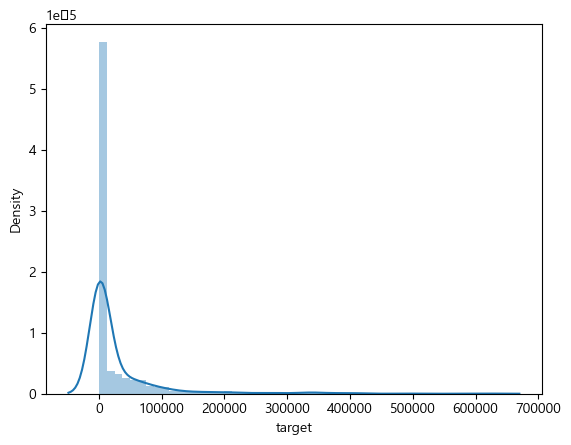

In [24]:
sns.distplot(covid_data["target"])
plt.show()

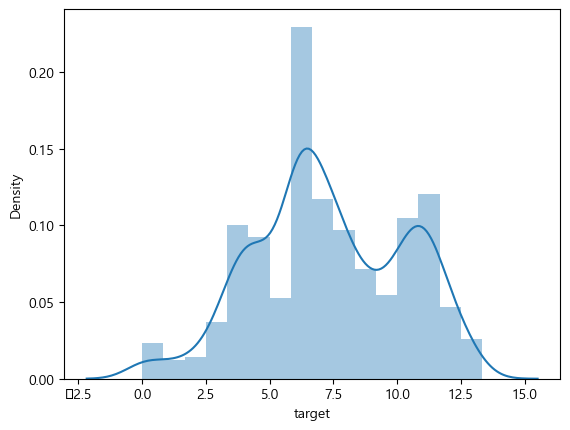

In [25]:
sns.distplot(np.log1p(covid_data["target"]))
plt.show()

- 0이하의 특정값이 많은 숫자를 가지고 있음
    - log를 통한 정규분포 모형 적용

- 독립변수의 단위가 다르기 때문에 scale을 적용

# log를 통한 정규분포 모형

In [26]:
x = covid_data.drop(["target"], axis = 1)
y = np.log1p(covid_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                              test_size = .2, random_state = 855)

In [27]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.937
Method:                 Least Squares   F-statistic:                     1001.
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:19:25   Log-Likelihood:                -1184.3
No. Observations:                1076   AIC:                             2403.
Df Residuals:                    1059   BIC:                             2487.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

- log 적용 시 R-squered가 0.939로 베이스라인모델보다 높은 수치를 보임
- AIC, BIC가 기존보다 줄어든 것으로 보임
- Cond. No.는 기존보다 좀 더 줄어들었으나 95.8로 낮은 수치는 아님
    - 여전히 다중공선성이 의심돼 VIF 확인한 결과 10이 넘는 컬럼이 다수 있음

In [28]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:15<00:00,  1.09s/it]


[('catboost', 0.17205271425132757),
 ('extra_tree', 0.17424282256052964),
 ('lightgbm', 0.17741150019870977),
 ('gradient_boost', 0.18140656258112545),
 ('xgboost', 0.19020448137881713),
 ('random_forest', 0.19267211541599485),
 ('adaboost', 0.28146752213511395),
 ('svr', 0.4100563818230274),
 ('linear', 0.5497636078534134),
 ('baysian_ridge', 0.5505667671207014),
 ('ardr_linear', 0.5506342178345174),
 ('ridge', 0.5506574602249439),
 ('elasticnet', 0.9713377092764925),
 ('lasso', 1.1795778595117836)]

In [29]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17205271425132757
test_cv MAE : 0.24386666221616574
R-squared : 0.99034, MAE: 4135.995, SMAPE:  10.073, MSE:  158255638.521 RMSE: 12579.970, RMSLE: 0.285


In [30]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17205271425132757
test_cv MAE : 0.24386666221616574
R-squared : 0.99229, MAE: 2639.428, SMAPE:  8.495, MSE:  80201125.030 RMSE: 8955.508, RMSLE: 0.255


- MAE가 낮은 Catboost를 사용해 확인
    - 2639으로 낮으나 다중공선성 해결 후 더 낮게 조정할 수 있을 것으로 판단됨
    - 검증 데이터를 적용하면 MAE 수치가 높아짐

# target과 컬럼 별 상관관계 확인

In [31]:
# covid_data의 target에 log 적용 후 확인
covid_data["target"] = np.log1p(covid_data["target"])

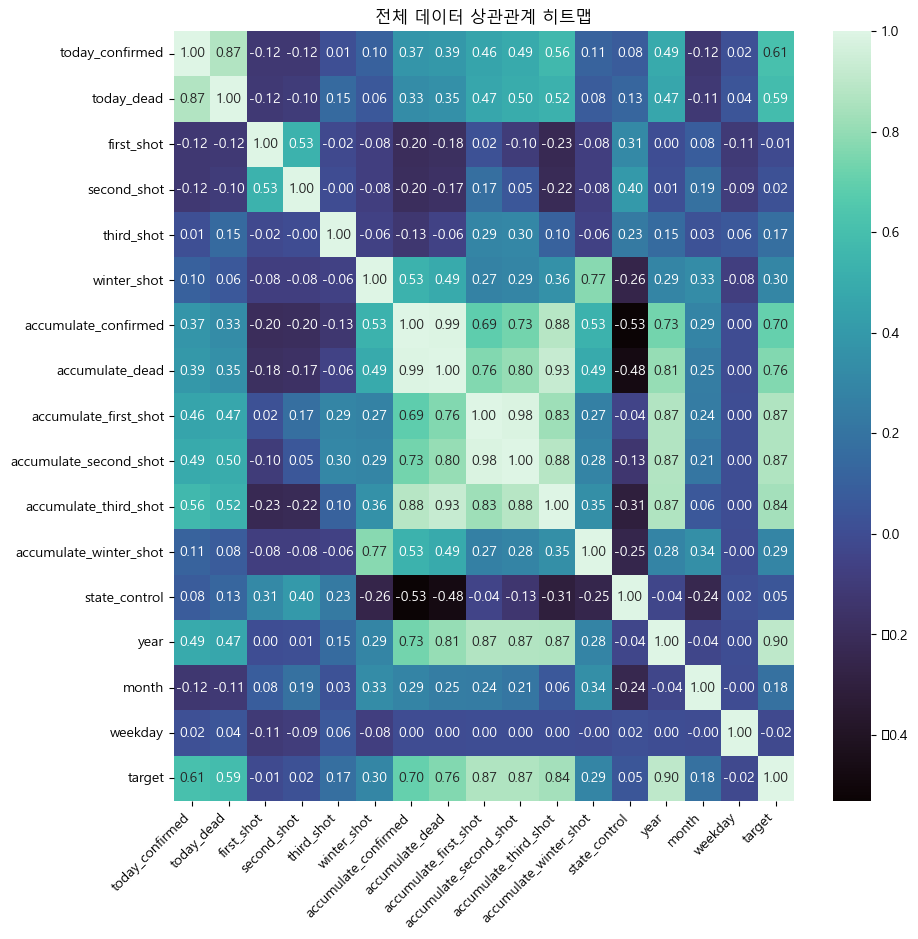

In [32]:
plt.figure(figsize = (10, 10))

ax = sns.heatmap(covid_data.corr(),
            annot = True,
            fmt = ".2f",
            cmap = "mako",
            annot_kws={"size": 10}
            )

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)

plt.title("전체 데이터 상관관계 히트맵")
plt.show()

In [33]:
# 상관관계 확인을 위한 log 제거
covid_data["target"] = np.expm1(covid_data["target"])

- 0.3이하의 상관관계를 보이는 컬럼 제거
    - 코로나 백신 데이터가 상관관계가 낮음
    - 국가통제, 월, 주 컬럼이 상관관계가 낮음

## 상관관계가 0.3 이하인 컬럼 제거

In [34]:
cor_covid_data = covid_data.drop(["first_shot", "second_shot",  "third_shot", "winter_shot",
                                  "accumulate_winter_shot", "state_control", "month", "weekday"], axis = 1)

In [35]:
cor_covid_data

,today_confirmed,today_dead,accumulate_confirmed,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,year,target
0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,2020,0.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2020,0.0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2020,0.0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2020,1.0
4,1.0,0.0,2.0,0.0,0.0,0.0,0.0,2020,0.0
...,...,...,...,...,...,...,...,...,...
1071,25530.0,42.0,28684374.0,31832.0,44861882.0,44442402.0,32499099.0,2022,87576.0
1072,87576.0,50.0,28771950.0,31882.0,44862134.0,44442663.0,32499099.0,2022,87491.0
1073,87491.0,69.0,28859441.0,31951.0,44862395.0,44442965.0,32499099.0,2022,71402.0
1074,71402.0,76.0,28930843.0,32027.0,44862644.0,44443249.0,32499099.0,2022,65201.0


## 상관관계 낮은 컬럼 제거 데이터 모델 적용

In [36]:
x = cor_covid_data.drop(["target"], axis = 1)
y = np.log1p(cor_covid_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                              test_size = .2, random_state = 855)

In [37]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.875
Model:                            OLS   Adj. R-squared:                  0.874
Method:                 Least Squares   F-statistic:                     935.0
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:20:49   Log-Likelihood:                -1560.4
No. Observations:                1076   AIC:                             3139.
Df Residuals:                    1067   BIC:                             3184.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

- 상관관계에 대한 높은 값을 제거 하니 R-squered를 비롯한 다른 값이 줄어듬
    - 모델 성능에 부정적 영향을 미침

In [38]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:10<00:00,  1.36it/s]


[('extra_tree', 0.22908860222683664),
 ('catboost', 0.2321790813560986),
 ('lightgbm', 0.23301324220499592),
 ('gradient_boost', 0.24112571670407537),
 ('random_forest', 0.24176545511129208),
 ('xgboost', 0.265731464937665),
 ('adaboost', 0.2894780462567319),
 ('svr', 0.563346942944187),
 ('baysian_ridge', 0.6815636548319872),
 ('ardr_linear', 0.6815692585941188),
 ('ridge', 0.6816867696123331),
 ('linear', 0.6831936181094244),
 ('elasticnet', 0.9713373325836555),
 ('lasso', 1.1795778595117836)]

In [39]:
# 검증 데이터 적용
model_result("ext", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.2272632586575723
test_cv MAE : 0.27324501963195613
R-squared : 0.98604, MAE: 6567.836, SMAPE:  11.819, MSE:  548515248.238 RMSE: 23420.402, RMSLE: 0.343


In [40]:
ext = ExtraTreesRegressor()
# 검증 데이터 미적용
model_result(ext, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.22816203316516354
test_cv MAE : 0.26580693050236076
R-squared : 0.98563, MAE: 6683.902, SMAPE:  12.028, MSE:  547588364.231 RMSE: 23400.606, RMSLE: 0.348


- Extratree를 사용하니 성능은 큰 차이가 없어 보이나 다중공선성이 의심될 때 보다 높은 MAE를 가짐
- 상관관계가 낮은 값을 제외하는 방법이 아닌 베이스라인 모델에 log값을 적용한 데이터에서 VIF가 높은 값을 제거해 다중공선성 영향 줄임

# VIF 높은 컬럼 제거

## "today_dead" 컬럼 제거

In [41]:
x = covid_data.drop(["target", "today_dead"], axis = 1)
y = np.log1p(covid_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                              test_size = .2, random_state = 855)

In [42]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.937
Method:                 Least Squares   F-statistic:                     1063.
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:21:12   Log-Likelihood:                -1186.9
No. Observations:                1076   AIC:                             2406.
Df Residuals:                    1060   BIC:                             2485.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

- 성능적 변화와 Cond. No.에 큰 차이가 없음

In [43]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:14<00:00,  1.05s/it]


[('catboost', 0.1667059796962957),
 ('extra_tree', 0.172578253589059),
 ('lightgbm', 0.17693097202004573),
 ('gradient_boost', 0.18023365319254508),
 ('xgboost', 0.19035921044663695),
 ('random_forest', 0.19171460830714854),
 ('adaboost', 0.2766980418643433),
 ('svr', 0.4183856700431107),
 ('linear', 0.5486961862282541),
 ('baysian_ridge', 0.5490575162839197),
 ('ridge', 0.5492885031180842),
 ('ardr_linear', 0.5495528081101615),
 ('elasticnet', 0.976699982250187),
 ('lasso', 1.1795778680149223)]

In [44]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1667059796962957
test_cv MAE : 0.24117690132355793
R-squared : 0.99132, MAE: 3253.201, SMAPE:  9.309, MSE:  106332967.426 RMSE: 10311.788, RMSLE: 0.271


In [45]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1667059796962957
test_cv MAE : 0.24117690132355793
R-squared : 0.99179, MAE: 2422.750, SMAPE:  8.594, MSE:  57712084.855 RMSE: 7596.847, RMSLE: 0.263


## "first_shot" 컬럼 제거

In [46]:
x = covid_data.drop(["target", "today_dead", "first_shot"], axis = 1)
y = np.log1p(covid_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                              test_size = .2, random_state = 855)

In [47]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.937
Method:                 Least Squares   F-statistic:                     1139.
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:22:05   Log-Likelihood:                -1187.3
No. Observations:                1076   AIC:                             2405.
Df Residuals:                    1061   BIC:                             2479.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [48]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:13<00:00,  1.03it/s]


[('catboost', 0.16479538380004716),
 ('lightgbm', 0.17575638069304653),
 ('extra_tree', 0.1764404615747097),
 ('gradient_boost', 0.17812890673897075),
 ('random_forest', 0.18960852882777546),
 ('xgboost', 0.19026392419917612),
 ('adaboost', 0.2708706999717104),
 ('svr', 0.4147019481942868),
 ('linear', 0.5479271422542458),
 ('baysian_ridge', 0.5484310759994119),
 ('ridge', 0.54878681353271),
 ('ardr_linear', 0.5495528792484196),
 ('elasticnet', 0.976699982250187),
 ('lasso', 1.1795778680149223)]

In [49]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.16479538380004716
test_cv MAE : 0.24214582870859172
R-squared : 0.99219, MAE: 3028.528, SMAPE:  9.063, MSE:  105867613.924 RMSE: 10289.199, RMSLE: 0.257


In [50]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.16479538380004716
test_cv MAE : 0.24214582870859172
R-squared : 0.99240, MAE: 2079.085, SMAPE:  8.490, MSE:  46928962.549 RMSE: 6850.472, RMSLE: 0.253


## "second_shot" 컬럼 제거

In [51]:
x = covid_data.drop(["target", "today_dead", "first_shot", "second_shot"], axis = 1)
y = np.log1p(covid_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                              test_size = .2, random_state = 855)

In [52]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.937
Model:                            OLS   Adj. R-squared:                  0.937
Method:                 Least Squares   F-statistic:                     1222.
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:23:09   Log-Likelihood:                -1189.6
No. Observations:                1076   AIC:                             2407.
Df Residuals:                    1062   BIC:                             2477.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [53]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:11<00:00,  1.23it/s]


[('catboost', 0.16465856799614115),
 ('lightgbm', 0.1753497277952562),
 ('extra_tree', 0.17617154566783863),
 ('gradient_boost', 0.18086403532686174),
 ('xgboost', 0.18867275807408004),
 ('random_forest', 0.19416551811670094),
 ('adaboost', 0.28603351575639424),
 ('svr', 0.4107891148389493),
 ('baysian_ridge', 0.5496291487345392),
 ('ridge', 0.5499654155886556),
 ('linear', 0.5500483812941432),
 ('ardr_linear', 0.5517843398429504),
 ('elasticnet', 0.976699982250187),
 ('lasso', 1.1795778680149223)]

In [54]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.16465856799614115
test_cv MAE : 0.2376688236453563
R-squared : 0.99206, MAE: 2977.796, SMAPE:  9.128, MSE:  84723285.064 RMSE: 9204.525, RMSLE: 0.259


In [55]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.16465856799614115
test_cv MAE : 0.2376688236453563
R-squared : 0.99226, MAE: 2206.464, SMAPE:  8.295, MSE:  55606448.591 RMSE: 7456.973, RMSLE: 0.255


## "third_shot" 컬럼 제거

In [56]:
x = covid_data.drop(["target", "today_dead", "first_shot", "second_shot", "third_shot"], axis = 1)
y = np.log1p(covid_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                              test_size = .2, random_state = 855)

In [57]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.937
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     1322.
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:23:55   Log-Likelihood:                -1190.8
No. Observations:                1076   AIC:                             2408.
Df Residuals:                    1063   BIC:                             2472.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [58]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:11<00:00,  1.18it/s]


[('catboost', 0.1705716644658223),
 ('lightgbm', 0.17633040731172603),
 ('extra_tree', 0.1811680511402497),
 ('gradient_boost', 0.1868434586170392),
 ('xgboost', 0.1943270913530138),
 ('random_forest', 0.19596400878477382),
 ('adaboost', 0.2858250674052874),
 ('svr', 0.411614220182396),
 ('baysian_ridge', 0.5502302337827791),
 ('ridge', 0.550401766711878),
 ('linear', 0.5508335447461473),
 ('ardr_linear', 0.5513885518317505),
 ('elasticnet', 0.9766999500726884),
 ('lasso', 1.1795778680149223)]

In [59]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1705716644658223
test_cv MAE : 0.2385145519823785
R-squared : 0.99224, MAE: 3398.426, SMAPE:  9.139, MSE:  132752528.663 RMSE: 11521.828, RMSLE: 0.256


In [60]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1705716644658223
test_cv MAE : 0.2385145519823785
R-squared : 0.99189, MAE: 2737.890, SMAPE:  8.773, MSE:  86706273.407 RMSE: 9311.620, RMSLE: 0.262


## "winter_shot" 컬럼 제거

In [61]:
x = covid_data.drop(["target",  "today_dead", "first_shot", "second_shot", "third_shot", "winter_shot"], axis = 1)
y = np.log1p(covid_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                              test_size = .2, random_state = 855)

In [62]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.937
Model:                            OLS   Adj. R-squared:                  0.937
Method:                 Least Squares   F-statistic:                     1443.
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:24:40   Log-Likelihood:                -1190.8
No. Observations:                1076   AIC:                             2406.
Df Residuals:                    1064   BIC:                             2465.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [63]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:11<00:00,  1.24it/s]


[('catboost', 0.1694808350411434),
 ('lightgbm', 0.17777566921572813),
 ('extra_tree', 0.180224592574052),
 ('gradient_boost', 0.18710017207836313),
 ('xgboost', 0.19248861702136247),
 ('random_forest', 0.19479305693830268),
 ('adaboost', 0.2801675862521648),
 ('svr', 0.40975331602430637),
 ('baysian_ridge', 0.5507988044855807),
 ('ridge', 0.5510481078090772),
 ('linear', 0.5512816302848667),
 ('ardr_linear', 0.551627243619343),
 ('elasticnet', 0.9766999550646837),
 ('lasso', 1.1795778680149223)]

In [64]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1694808350411434
test_cv MAE : 0.23303254505643886
R-squared : 0.99386, MAE: 3043.939, SMAPE:  8.776, MSE:  125450773.648 RMSE: 11200.481, RMSLE: 0.227


In [65]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1694808350411434
test_cv MAE : 0.23303254505643886
R-squared : 0.99163, MAE: 2762.064, SMAPE:  8.832, MSE:  102612599.897 RMSE: 10129.788, RMSLE: 0.266


## "accumulate_confirmed" 컬럼 제거

In [66]:
x = covid_data.drop(["target", "today_dead",
              "first_shot", "second_shot", "third_shot",
              "winter_shot", "accumulate_confirmed"], axis = 1)
y = np.log1p(covid_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                              test_size = .2, random_state = 855)

In [67]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.937
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     1575.
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:25:23   Log-Likelihood:                -1195.4
No. Observations:                1076   AIC:                             2413.
Df Residuals:                    1065   BIC:                             2468.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [68]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:10<00:00,  1.29it/s]


[('catboost', 0.16820957526089245),
 ('lightgbm', 0.17869817004513694),
 ('extra_tree', 0.1817476218246387),
 ('gradient_boost', 0.18595311846475612),
 ('random_forest', 0.19634943866814797),
 ('xgboost', 0.19701355745818994),
 ('adaboost', 0.29581866171742305),
 ('svr', 0.40809977696797206),
 ('ardr_linear', 0.5516242408385891),
 ('baysian_ridge', 0.5528870464255821),
 ('ridge', 0.5529367407660578),
 ('linear', 0.5533343803600916),
 ('elasticnet', 0.9771709675559382),
 ('lasso', 1.1795777823151734)]

In [69]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.16820957526089245
test_cv MAE : 0.23730793958622742
R-squared : 0.99281, MAE: 2920.872, SMAPE:  9.062, MSE:  102810056.131 RMSE: 10139.529, RMSLE: 0.246


In [70]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.16820957526089245
test_cv MAE : 0.23730793958622742
R-squared : 0.99380, MAE: 2599.182, SMAPE:  8.353, MSE:  92956814.101 RMSE: 9641.411, RMSLE: 0.229


## "accumulate_dead" 컬럼 삭제

In [71]:
x = covid_data.drop(["target", "today_dead",
              "first_shot", "second_shot", "third_shot",
              "winter_shot", "accumulate_confirmed", "accumulate_dead"], axis = 1)
y = np.log1p(covid_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                              test_size = .2, random_state = 855)

In [72]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.937
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     1751.
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:26:03   Log-Likelihood:                -1195.4
No. Observations:                1076   AIC:                             2411.
Df Residuals:                    1066   BIC:                             2461.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [73]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:10<00:00,  1.35it/s]


[('catboost', 0.17508006307889273),
 ('lightgbm', 0.1824659836993355),
 ('gradient_boost', 0.1898989839455826),
 ('extra_tree', 0.19044317585261167),
 ('random_forest', 0.198730220200113),
 ('xgboost', 0.2007616123109653),
 ('adaboost', 0.2924399757659878),
 ('svr', 0.40731964756834377),
 ('ardr_linear', 0.5516069450322307),
 ('baysian_ridge', 0.5517686976097932),
 ('ridge', 0.5517759736922019),
 ('linear', 0.552142678009637),
 ('elasticnet', 0.9835091203550579),
 ('lasso', 1.179577549229192)]

In [74]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17508006307889273
test_cv MAE : 0.24543516551181863
R-squared : 0.99179, MAE: 3234.251, SMAPE:  9.030, MSE:  108231715.097 RMSE: 10403.447, RMSLE: 0.263


In [75]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17508006307889273
test_cv MAE : 0.24543516551181863
R-squared : 0.99279, MAE: 2826.383, SMAPE:  8.694, MSE:  102746500.310 RMSE: 10136.395, RMSLE: 0.247


## "accumulate_first_shot" 컬럼 제거

In [76]:
x = covid_data.drop(["target", "today_dead",
              "first_shot", "second_shot", "third_shot",
              "winter_shot", "accumulate_confirmed", "accumulate_dead",
              "accumulate_first_shot"], axis = 1)
y = np.log1p(covid_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                    test_size = .2, random_state = 855)

In [77]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.933
Model:                            OLS   Adj. R-squared:                  0.932
Method:                 Least Squares   F-statistic:                     1845.
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:26:52   Log-Likelihood:                -1228.8
No. Observations:                1076   AIC:                             2476.
Df Residuals:                    1067   BIC:                             2520.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [78]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:11<00:00,  1.27it/s]


[('catboost', 0.17452472183655293),
 ('lightgbm', 0.18293000564195588),
 ('extra_tree', 0.18970914447874182),
 ('gradient_boost', 0.19002990901001388),
 ('random_forest', 0.1983528529613172),
 ('xgboost', 0.2001532228057727),
 ('adaboost', 0.2900825894929976),
 ('svr', 0.4033875085551413),
 ('ridge', 0.579884553365791),
 ('baysian_ridge', 0.5799886251233809),
 ('linear', 0.5803854181678119),
 ('ardr_linear', 0.5805249257866004),
 ('elasticnet', 1.042745211983361),
 ('lasso', 1.1861401439805515)]

In [79]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17452472183655293
test_cv MAE : 0.24876853882061276
R-squared : 0.99180, MAE: 3190.830, SMAPE:  8.880, MSE:  111905962.093 RMSE: 10578.561, RMSLE: 0.263


In [80]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17452472183655293
test_cv MAE : 0.24876853882061276
R-squared : 0.99210, MAE: 2782.154, SMAPE:  8.741, MSE:  94016247.824 RMSE: 9696.198, RMSLE: 0.258


- 최적화 모델
    - Catboost를 통해 "today_dead", "first_shot", "second_shot", "third_shot", "winter_shot", "accumulate_confirmed"을 제외한 데이터가 가장 성능이 좋은 것으로 판단
        - R-squared : 0.994, MAE: 2599.182
    - 이후 컬럼 제거 시 성능이 저하 됨
    - 이전 모델에서 MAE 값이 낮은 모델이 있었지만 다중공선성 의심 때문에 미적용

# 최종 모델

In [81]:
x = covid_data.drop(["target", "today_dead",
              "first_shot", "second_shot", "third_shot",
              "winter_shot", "accumulate_confirmed"], axis = 1)
y = np.log1p(covid_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                              test_size = .2, random_state = 855)

In [82]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.937
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     1575.
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:27:36   Log-Likelihood:                -1195.4
No. Observations:                1076   AIC:                             2413.
Df Residuals:                    1065   BIC:                             2468.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [83]:
cat = CatBoostRegressor(verbose = False)
cat.fit(scaled_train, y_train)
cat.score(scaled_test, y_test)

0.9938026703584995

In [84]:
y_test_1 = np.expm1(y_test)

In [85]:
scaled_test

array([[ 0.49114112,  2.01420245,  1.12811608, ...,  1.21098027,
         1.2909267 ,  0.00232478],
       [-0.37508731, -0.47241918,  0.9845236 , ..., -0.01943972,
         1.2909267 ,  1.50320088],
       [-0.41126426, -0.73190072, -1.02498408, ..., -1.24985972,
        -0.18082275,  1.00290884],
       ...,
       [-0.35530161, -0.21302934,  1.09626472, ...,  1.21098027,
        -1.6525722 ,  0.50261681],
       [ 0.32017981,  1.80029064,  1.12752508, ...,  1.21098027,
         0.70222692, -0.99825929],
       [ 0.30672431,  2.02758913,  1.1281467 , ...,  1.21098027,
         1.2909267 ,  1.50320088]])

In [86]:
pred = cat.predict(scaled_test)

In [87]:
pred

array([10.90223471,  7.71006305,  3.71590699,  6.28422567,  8.38667429,
        5.84294506,  7.43759143,  3.90046515,  4.16776171,  5.14453051,
       11.33856049,  4.2621142 ,  5.88072298, 10.75729729,  6.50497621,
        6.01753199,  5.9206738 ,  4.4057268 ,  3.91639596,  5.0511022 ,
        8.38380233,  1.98738822,  6.22866943,  9.92410707,  4.11324687,
        4.93544603,  4.98516014,  4.31086557,  6.20644146,  8.40183407,
        9.15015267,  4.73525734,  8.95791247, 10.93349951,  8.76980078,
       12.35577205,  6.35547932, 11.06432325, 11.1639827 , 12.67229122,
        4.09272796,  2.15424485,  0.05294375,  8.93518374,  5.55952511,
        6.9390936 , 11.04616242,  3.13575502,  5.56629051,  4.33810351,
       10.56131396, 12.52253479, 10.859551  , 11.32497732,  7.40637397,
       11.46682955, 12.01378681,  7.33438953,  7.06545856, 12.09983777,
        9.9610822 ,  6.46262558,  6.55752614,  0.71080648,  9.91334801,
        6.07305051,  7.15233849,  7.71227322,  3.27609096, 10.89

In [88]:
np.set_printoptions(precision=0, suppress=True)
pred_1 =np.expm1(pred)
pred_1

array([ 54297.,   2230.,     40.,    535.,   4387.,    344.,   1698.,
           48.,     64.,    170.,  83998.,     70.,    357.,  46971.,
          667.,    410.,    372.,     81.,     49.,    155.,   4375.,
            6.,    506.,  20416.,     60.,    138.,    145.,     74.,
          495.,   4454.,   9415.,    113.,   7768.,  56021.,   6436.,
       232296.,    575.,  63851.,  70542., 318790.,     59.,      8.,
            0.,   7594.,    259.,   1031.,  62702.,     22.,    260.,
           76.,  38611., 274452.,  52028.,  82865.,   1645.,  95494.,
       165013.,   1531.,   1170., 179842.,  21185.,    640.,    704.,
            1.,  20197.,    433.,   1276.,   2235.,     25.,  54143.,
          311.,      1.,    415.,     29.,   3597., 125242.,  24422.,
       110916.,   1907.,    555.,    444.,    463.,    720.,     26.,
          283.,   1912.,   4416.,     55.,    520.,    244.,    493.,
        49867.,   1128.,   1745.,  85048.,    605.,  18361.,  11054.,
          606.,    8

In [89]:
predict = pd.DataFrame({"실제값" : y_test_1, "예측값" : pred_1})
predict

,실제값,예측값
1039,53683.0,54296.567423
664,2003.0,2229.682897
138,57.0,40.095844
468,488.0,535.049052
725,4418.0,4387.199524
...,...,...
771,219214.0,245203.794233
228,168.0,191.449614
718,3503.0,3993.898665
974,41263.0,49800.902243


In [90]:
predict = predict.astype("int")

In [91]:
predict["차이"] = predict["실제값"] - predict["예측값"]

In [92]:
predict = predict.astype("int")

In [93]:
predict.head(10)

,실제값,예측값,차이
1039,53682,54296,-614
664,2002,2229,-227
138,56,40,16
468,488,535,-47
725,4417,4387,30
370,437,343,94
638,1571,1697,-126
78,53,48,5
183,62,63,-1
300,222,170,52


# 경제

In [94]:
economy = pd.read_csv("./data/total_data.csv")
economy

,date,exchange_rate,kospi,kospi_volume,kosdaq,kosdaq_volume,today_confirmed,today_dead,first_shot,second_shot,...,winter_shot,accumulate_confirmed,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control
0,2018-01-02,1065.219971,2479.649902,262200.0,812.450012,989200.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
1,2018-01-03,1062.540039,2486.350098,331100.0,822.309998,1203100.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
2,2018-01-04,1063.939941,2466.459961,333800.0,808.010010,1346500.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
3,2018-01-05,1061.079956,2497.520020,308800.0,828.030029,1229200.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
4,2018-01-06,1061.079956,2497.520020,308800.0,828.030029,1229200.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1820,2022-12-27,1275.130005,2332.790039,448300.0,704.190002,900.0,87576.0,50.0,252.0,261.0,...,77169.0,28771950.0,31882.0,44862134.0,44442663.0,32499099.0,5025925.0,3.0,109.280,1
1821,2022-12-28,1272.280029,2280.449951,405700.0,692.369995,800.0,87491.0,69.0,261.0,302.0,...,69296.0,28859441.0,31951.0,44862395.0,44442965.0,32499099.0,5095221.0,3.0,109.280,1
1822,2022-12-29,1274.319946,2236.399902,361000.0,679.289978,1000.0,71402.0,76.0,249.0,284.0,...,72120.0,28930843.0,32027.0,44862644.0,44443249.0,32499099.0,5167341.0,3.0,109.280,1
1823,2022-12-30,1260.260010,2236.399902,361000.0,679.289978,1000.0,65201.0,68.0,330.0,392.0,...,81364.0,28996044.0,32095.0,44862974.0,44443641.0,32499099.0,5248705.0,3.0,109.280,1


# date 컬럼 year, month, day, weekday컬럼으로 변경

In [95]:
economy["date"] = pd.to_datetime(economy["date"])
economy["year"] = economy["date"].dt.year
economy["month"] = economy["date"].dt.month
economy["day"] = economy["date"].dt.day
economy["weekday"] = economy["date"].map(lambda x : pd.to_datetime(x).weekday())

In [96]:
economy = economy.drop(["date"], axis = 1)
economy

,exchange_rate,kospi,kospi_volume,kosdaq,kosdaq_volume,today_confirmed,today_dead,first_shot,second_shot,third_shot,...,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control,year,month,day,weekday
0,1065.219971,2479.649902,262200.0,812.450012,989200.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,3.7,98.106,0,2018,1,2,1
1,1062.540039,2486.350098,331100.0,822.309998,1203100.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,3.7,98.106,0,2018,1,3,2
2,1063.939941,2466.459961,333800.0,808.010010,1346500.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,3.7,98.106,0,2018,1,4,3
3,1061.079956,2497.520020,308800.0,828.030029,1229200.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,3.7,98.106,0,2018,1,5,4
4,1061.079956,2497.520020,308800.0,828.030029,1229200.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,3.7,98.106,0,2018,1,6,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1820,1275.130005,2332.790039,448300.0,704.190002,900.0,87576.0,50.0,252.0,261.0,0.0,...,44442663.0,32499099.0,5025925.0,3.0,109.280,1,2022,12,27,1
1821,1272.280029,2280.449951,405700.0,692.369995,800.0,87491.0,69.0,261.0,302.0,0.0,...,44442965.0,32499099.0,5095221.0,3.0,109.280,1,2022,12,28,2
1822,1274.319946,2236.399902,361000.0,679.289978,1000.0,71402.0,76.0,249.0,284.0,0.0,...,44443249.0,32499099.0,5167341.0,3.0,109.280,1,2022,12,29,3
1823,1260.260010,2236.399902,361000.0,679.289978,1000.0,65201.0,68.0,330.0,392.0,0.0,...,44443641.0,32499099.0,5248705.0,3.0,109.280,1,2022,12,30,4


# target 값 설정

In [97]:
economy["target"] = economy[1:].reset_index(drop = True)["today_confirmed"]
economy = economy.drop(1824, axis = 0)
economy

,exchange_rate,kospi,kospi_volume,kosdaq,kosdaq_volume,today_confirmed,today_dead,first_shot,second_shot,third_shot,...,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control,year,month,day,weekday,target
0,1065.219971,2479.649902,262200.0,812.450012,989200.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,3.7,98.106,0,2018,1,2,1,0.0
1,1062.540039,2486.350098,331100.0,822.309998,1203100.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,3.7,98.106,0,2018,1,3,2,0.0
2,1063.939941,2466.459961,333800.0,808.010010,1346500.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,3.7,98.106,0,2018,1,4,3,0.0
3,1061.079956,2497.520020,308800.0,828.030029,1229200.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,3.7,98.106,0,2018,1,5,4,0.0
4,1061.079956,2497.520020,308800.0,828.030029,1229200.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,3.7,98.106,0,2018,1,6,5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1819,1279.239990,2317.139893,427600.0,691.250000,1100.0,25530.0,42.0,265.0,238.0,0.0,...,32499099.0,4948756.0,3.0,109.280,1,2022,12,26,0,87576.0
1820,1275.130005,2332.790039,448300.0,704.190002,900.0,87576.0,50.0,252.0,261.0,0.0,...,32499099.0,5025925.0,3.0,109.280,1,2022,12,27,1,87491.0
1821,1272.280029,2280.449951,405700.0,692.369995,800.0,87491.0,69.0,261.0,302.0,0.0,...,32499099.0,5095221.0,3.0,109.280,1,2022,12,28,2,71402.0
1822,1274.319946,2236.399902,361000.0,679.289978,1000.0,71402.0,76.0,249.0,284.0,0.0,...,32499099.0,5167341.0,3.0,109.280,1,2022,12,29,3,65201.0


# 컬럼 설명
|컬럼명|설 명|
|---|---|
|  date  |  날짜  |
|  exchange_rate  |  환율  |
|  kospi  |  코스피  |
|  kospi_volume  |  코스피 거래량  |
|  kosdaq  |  코스닥  |
|  kosdaq_volume  |  코스닥 거래량  |
|  today_confirmed  |  일일 확진자  |
|  today_dead  |  일일 사망자  |
|  first_shot  |  1차 접종자  |
|  second_shot  |  2차 접종자  |
|  third_shot  |  3차 접종자  |
|  winter_shot  |  동절기 접종자  |
|  accmulate_confirmed  |  누적 확진자  |
|  accmulate_dead  |  누적 사망자  |
|  accmulate_first_shot  |  누적 1차 접종자  |
|  accmulate_second_shot  |  누적 2차 접종자  |
|  accmulate_third_shot  |  누적 3차 접종자  |
|  accmulate_winter_shot  |  누적 동절기 접종자  |
|  jobless  |  실업률  |
|  price_index  |  소비자물가지수  |
|  state_control  |  국가 통제(거리두기)  |
|  year  |  년도  |
|  month  |  월  |
|  weekday  |  요일  |

# 베이스라인 모델

In [98]:
x = economy.drop(["target"], axis = 1)
y = np.log1p(economy["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                    test_size = .2, random_state = 855)

In [99]:
ols_pvalue_vif(scaled_test, y_test)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.977
Model:                            OLS   Adj. R-squared:                  0.976
Method:                 Least Squares   F-statistic:                     605.6
Date:                Sun, 05 Mar 2023   Prob (F-statistic):          1.06e-262
Time:                        15:27:54   Log-Likelihood:                -368.40
No. Observations:                 365   AIC:                             786.8
Df Residuals:                     340   BIC:                             884.3
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      4

# 종속변수 시각화

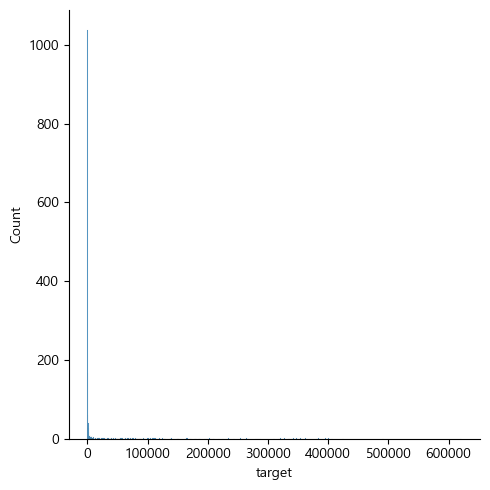

In [100]:
sns.displot(economy["target"])
plt.show()

## log 적용

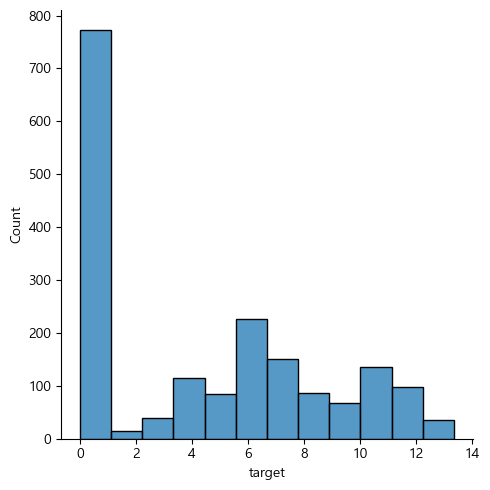

In [101]:
sns.displot(np.log1p(economy["target"]))
plt.show()

- 종속변수에 0의 수가 많아 최적화를 시도해도 다중공선성이 높음
    - 국내 코로나 발병 시기부터 기간 조정

# 코로나 + 경제

# 데이터 호출

In [102]:
total_data = pd.read_csv("./data/total_data.csv")
total_data

,date,exchange_rate,kospi,kospi_volume,kosdaq,kosdaq_volume,today_confirmed,today_dead,first_shot,second_shot,...,winter_shot,accumulate_confirmed,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control
0,2018-01-02,1065.219971,2479.649902,262200.0,812.450012,989200.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
1,2018-01-03,1062.540039,2486.350098,331100.0,822.309998,1203100.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
2,2018-01-04,1063.939941,2466.459961,333800.0,808.010010,1346500.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
3,2018-01-05,1061.079956,2497.520020,308800.0,828.030029,1229200.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
4,2018-01-06,1061.079956,2497.520020,308800.0,828.030029,1229200.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1820,2022-12-27,1275.130005,2332.790039,448300.0,704.190002,900.0,87576.0,50.0,252.0,261.0,...,77169.0,28771950.0,31882.0,44862134.0,44442663.0,32499099.0,5025925.0,3.0,109.280,1
1821,2022-12-28,1272.280029,2280.449951,405700.0,692.369995,800.0,87491.0,69.0,261.0,302.0,...,69296.0,28859441.0,31951.0,44862395.0,44442965.0,32499099.0,5095221.0,3.0,109.280,1
1822,2022-12-29,1274.319946,2236.399902,361000.0,679.289978,1000.0,71402.0,76.0,249.0,284.0,...,72120.0,28930843.0,32027.0,44862644.0,44443249.0,32499099.0,5167341.0,3.0,109.280,1
1823,2022-12-30,1260.260010,2236.399902,361000.0,679.289978,1000.0,65201.0,68.0,330.0,392.0,...,81364.0,28996044.0,32095.0,44862974.0,44443641.0,32499099.0,5248705.0,3.0,109.280,1


In [103]:
total_data[total_data["date"] == "2020-01-20"]

,date,exchange_rate,kospi,kospi_volume,kosdaq,kosdaq_volume,today_confirmed,today_dead,first_shot,second_shot,...,winter_shot,accumulate_confirmed,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control
748,2020-01-20,1160.359985,2262.639893,545500.0,683.469971,1000.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,0


In [104]:
total_data = total_data[748:]
total_data = total_data.reset_index(drop=True)

# date 컬럼 year, month, day, weekday컬럼으로 변경

In [105]:
total_data["date"] = pd.to_datetime(total_data["date"])
total_data["year"] = total_data["date"].dt.year
total_data["month"] = total_data["date"].dt.month
total_data["day"] = total_data["date"].dt.day
total_data["weekday"] = total_data["date"].map(lambda x : pd.to_datetime(x).weekday())

In [106]:
total_data

,date,exchange_rate,kospi,kospi_volume,kosdaq,kosdaq_volume,today_confirmed,today_dead,first_shot,second_shot,...,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control,year,month,day,weekday
0,2020-01-20,1160.359985,2262.639893,545500.0,683.469971,1000.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,0,2020,1,20,0
1,2020-01-21,1157.569946,2239.689941,770300.0,676.520020,1000.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,21,1
2,2020-01-22,1168.739990,2267.250000,608500.0,688.250000,1000.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,22,2
3,2020-01-23,1163.729980,2246.129883,509600.0,685.570007,1000.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,23,3
4,2020-01-24,1167.599976,2246.129883,509600.0,685.570007,1000.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,24,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1072,2022-12-27,1275.130005,2332.790039,448300.0,704.190002,900.0,87576.0,50.0,252.0,261.0,...,44442663.0,32499099.0,5025925.0,3.0,109.28,1,2022,12,27,1
1073,2022-12-28,1272.280029,2280.449951,405700.0,692.369995,800.0,87491.0,69.0,261.0,302.0,...,44442965.0,32499099.0,5095221.0,3.0,109.28,1,2022,12,28,2
1074,2022-12-29,1274.319946,2236.399902,361000.0,679.289978,1000.0,71402.0,76.0,249.0,284.0,...,44443249.0,32499099.0,5167341.0,3.0,109.28,1,2022,12,29,3
1075,2022-12-30,1260.260010,2236.399902,361000.0,679.289978,1000.0,65201.0,68.0,330.0,392.0,...,44443641.0,32499099.0,5248705.0,3.0,109.28,1,2022,12,30,4


In [107]:
total_data = total_data.drop(["date"], axis = 1)
total_data

,exchange_rate,kospi,kospi_volume,kosdaq,kosdaq_volume,today_confirmed,today_dead,first_shot,second_shot,third_shot,...,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control,year,month,day,weekday
0,1160.359985,2262.639893,545500.0,683.469971,1000.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,0,2020,1,20,0
1,1157.569946,2239.689941,770300.0,676.520020,1000.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,21,1
2,1168.739990,2267.250000,608500.0,688.250000,1000.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,22,2
3,1163.729980,2246.129883,509600.0,685.570007,1000.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,23,3
4,1167.599976,2246.129883,509600.0,685.570007,1000.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,24,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1072,1275.130005,2332.790039,448300.0,704.190002,900.0,87576.0,50.0,252.0,261.0,0.0,...,44442663.0,32499099.0,5025925.0,3.0,109.28,1,2022,12,27,1
1073,1272.280029,2280.449951,405700.0,692.369995,800.0,87491.0,69.0,261.0,302.0,0.0,...,44442965.0,32499099.0,5095221.0,3.0,109.28,1,2022,12,28,2
1074,1274.319946,2236.399902,361000.0,679.289978,1000.0,71402.0,76.0,249.0,284.0,0.0,...,44443249.0,32499099.0,5167341.0,3.0,109.28,1,2022,12,29,3
1075,1260.260010,2236.399902,361000.0,679.289978,1000.0,65201.0,68.0,330.0,392.0,0.0,...,44443641.0,32499099.0,5248705.0,3.0,109.28,1,2022,12,30,4


# target 값 설정

In [108]:
total_data["target"] = total_data[1:].reset_index(drop = True)["today_confirmed"]
total_data = total_data.drop(1076, axis = 0)
total_data

,exchange_rate,kospi,kospi_volume,kosdaq,kosdaq_volume,today_confirmed,today_dead,first_shot,second_shot,third_shot,...,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control,year,month,day,weekday,target
0,1160.359985,2262.639893,545500.0,683.469971,1000.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,4.1,100.09,0,2020,1,20,0,0.0
1,1157.569946,2239.689941,770300.0,676.520020,1000.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,4.1,100.09,1,2020,1,21,1,0.0
2,1168.739990,2267.250000,608500.0,688.250000,1000.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,4.1,100.09,1,2020,1,22,2,0.0
3,1163.729980,2246.129883,509600.0,685.570007,1000.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,4.1,100.09,1,2020,1,23,3,1.0
4,1167.599976,2246.129883,509600.0,685.570007,1000.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,4.1,100.09,1,2020,1,24,4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,1279.239990,2317.139893,427600.0,691.250000,1100.0,25530.0,42.0,265.0,238.0,0.0,...,32499099.0,4948756.0,3.0,109.28,1,2022,12,26,0,87576.0
1072,1275.130005,2332.790039,448300.0,704.190002,900.0,87576.0,50.0,252.0,261.0,0.0,...,32499099.0,5025925.0,3.0,109.28,1,2022,12,27,1,87491.0
1073,1272.280029,2280.449951,405700.0,692.369995,800.0,87491.0,69.0,261.0,302.0,0.0,...,32499099.0,5095221.0,3.0,109.28,1,2022,12,28,2,71402.0
1074,1274.319946,2236.399902,361000.0,679.289978,1000.0,71402.0,76.0,249.0,284.0,0.0,...,32499099.0,5167341.0,3.0,109.28,1,2022,12,29,3,65201.0


# 검증방법

## 선형성

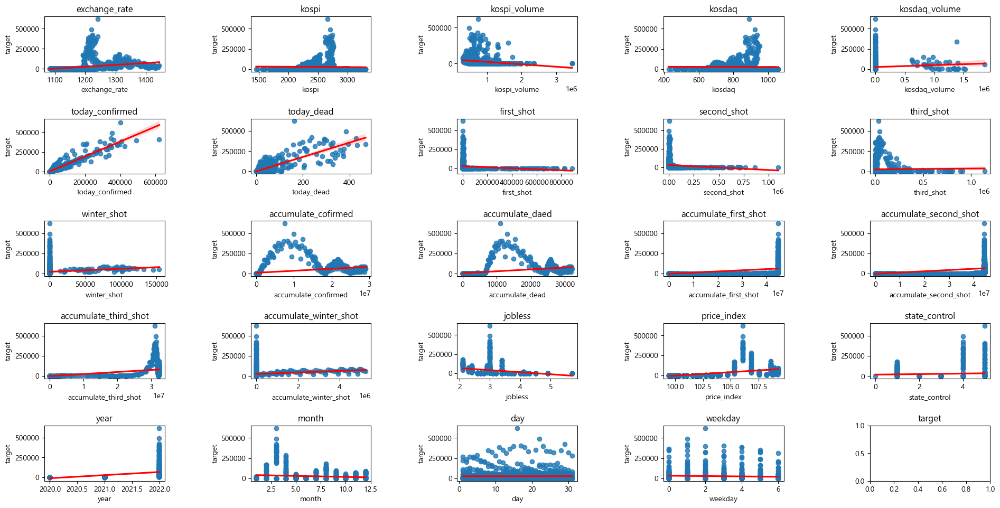

In [109]:
fig, axes = plt.subplots(nrows = 5, ncols = 5)
plt.tight_layout()
fig.set_size_inches(20, 10)

sns.regplot(y = "target", x = "exchange_rate", data = total_data, ax = axes[0, 0], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "kospi", data = total_data, ax = axes[0, 1], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "kospi_volume", data = total_data, ax = axes[0, 2], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "kosdaq", data = total_data, ax = axes[0, 3], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "kosdaq_volume", data = total_data, ax = axes[0, 4], line_kws = {"color" : "red"})

sns.regplot(y = "target", x = "today_confirmed", data = total_data, ax = axes[1, 0], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "today_dead", data = total_data, ax = axes[1, 1], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "first_shot", data = total_data, ax = axes[1, 2], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "second_shot", data = total_data, ax = axes[1, 3], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "third_shot", data = total_data, ax = axes[1, 4], line_kws = {"color" : "red"})

sns.regplot(y = "target", x = "winter_shot", data = total_data, ax = axes[2, 0], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "accumulate_confirmed", data = total_data, ax = axes[2, 1], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "accumulate_dead", data = total_data, ax = axes[2, 2], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "accumulate_first_shot", data = total_data, ax = axes[2, 3], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "accumulate_second_shot", data = total_data, ax = axes[2, 4], line_kws = {"color" : "red"})

sns.regplot(y = "target", x = "accumulate_third_shot", data = total_data, ax = axes[3, 0], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "accumulate_winter_shot", data = total_data, ax = axes[3, 1], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "jobless", data = total_data, ax = axes[3, 2], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "price_index", data = total_data, ax = axes[3, 3], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "state_control", data = total_data, ax = axes[3, 4], line_kws = {"color" : "red"})

sns.regplot(y = "target", x = "year", data = total_data, ax = axes[4, 0], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "month", data = total_data, ax = axes[4, 1], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "day", data = total_data, ax = axes[4, 2], line_kws = {"color" : "red"})
sns.regplot(y = "target", x = "weekday", data = total_data, ax = axes[4, 3], line_kws = {"color" : "red"})

axes[0, 0].set_title("exchange_rate")
axes[0, 1].set_title("kospi")
axes[0, 2].set_title("kospi_volume")
axes[0, 3].set_title("kosdaq")
axes[0, 4].set_title("kosdaq_volume")

axes[1, 0].set_title("today_confirmed")
axes[1, 1].set_title("today_dead")
axes[1, 2].set_title("first_shot")
axes[1, 3].set_title("second_shot")
axes[1, 4].set_title("third_shot")

axes[2, 0].set_title("winter_shot")
axes[2, 1].set_title("accumulate_cofirmed")
axes[2, 2].set_title("accumulate_daed")
axes[2, 3].set_title("accumulate_first_shot")
axes[2, 4].set_title("accumulate_second_shot")

axes[3, 0].set_title("accumulate_third_shot")
axes[3, 1].set_title("accumulate_winter_shot")
axes[3, 2].set_title("jobless")
axes[3, 3].set_title("price_index")
axes[3, 4].set_title("state_control")

axes[4, 0].set_title("year")
axes[4, 1].set_title("month")
axes[4, 2].set_title("day")
axes[4, 3].set_title("weekday")
axes[4, 4].set_title("target")

plt.show()

## 등분산성

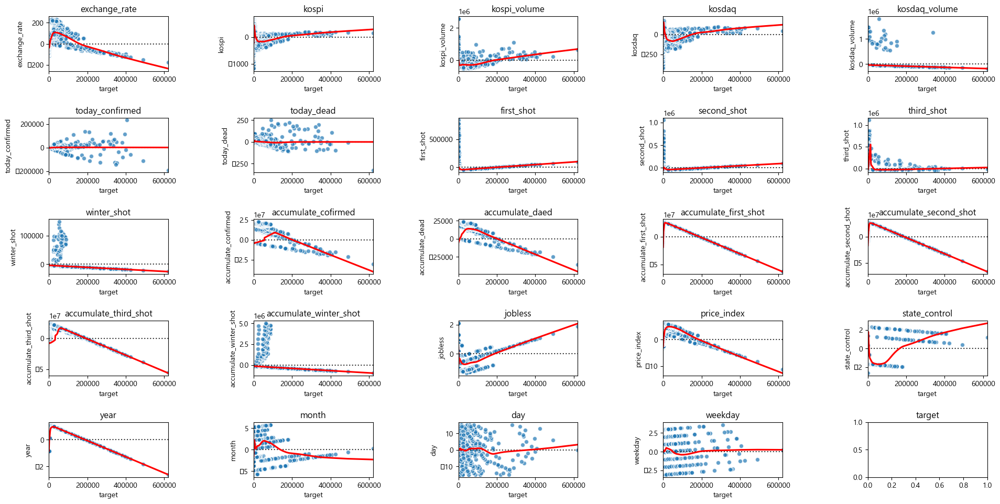

In [110]:
fig, axes = plt.subplots(nrows = 5, ncols = 5)
plt.tight_layout()
fig.set_size_inches(20, 10)

sns.residplot(x = "target", y = "exchange_rate", data = total_data, ax = axes[0, 0],scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "kospi", data = total_data, ax = axes[0, 1] ,scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "kospi_volume", data = total_data, ax = axes[0, 2], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "kosdaq", data = total_data, ax = axes[0, 3], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "kosdaq_volume", data = total_data, ax = axes[0, 4], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})

sns.residplot(x = "target", y = "today_confirmed", data = total_data, ax = axes[1, 0], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "today_dead", data = total_data, ax = axes[1, 1], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "first_shot", data = total_data, ax = axes[1, 2], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "second_shot", data = total_data, ax = axes[1, 3], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "third_shot", data = total_data, ax = axes[1, 4], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})

sns.residplot(x = "target", y = "winter_shot", data = total_data, ax = axes[2, 0], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "accumulate_confirmed", data = total_data, ax = axes[2, 1], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "accumulate_dead", data = total_data, ax = axes[2, 2], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "accumulate_first_shot", data = total_data, ax = axes[2, 3], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "accumulate_second_shot", data = total_data, ax = axes[2, 4], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})

sns.residplot(x = "target", y = "accumulate_third_shot", data = total_data, ax = axes[3, 0], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "accumulate_winter_shot", data = total_data, ax = axes[3, 1], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "jobless", data = total_data, ax = axes[3, 2], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "price_index", data = total_data, ax = axes[3, 3], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "state_control", data = total_data, ax = axes[3, 4], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})

sns.residplot(x = "target", y = "year", data = total_data, ax = axes[4, 0], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "month", data = total_data, ax = axes[4, 1], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "day", data = total_data, ax = axes[4, 2], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})
sns.residplot(x = "target", y = "weekday", data = total_data, ax = axes[4, 3], scatter_kws = {'edgecolor':"white", "alpha":0.7},lowess = True, line_kws = {"color":"red"})

axes[0, 0].set_title("exchange_rate")
axes[0, 1].set_title("kospi")
axes[0, 2].set_title("kospi_volume")
axes[0, 3].set_title("kosdaq")
axes[0, 4].set_title("kosdaq_volume")

axes[1, 0].set_title("today_confirmed")
axes[1, 1].set_title("today_dead")
axes[1, 2].set_title("first_shot")
axes[1, 3].set_title("second_shot")
axes[1, 4].set_title("third_shot")

axes[2, 0].set_title("winter_shot")
axes[2, 1].set_title("accumulate_cofirmed")
axes[2, 2].set_title("accumulate_daed")
axes[2, 3].set_title("accumulate_first_shot")
axes[2, 4].set_title("accumulate_second_shot")

axes[3, 0].set_title("accumulate_third_shot")
axes[3, 1].set_title("accumulate_winter_shot")
axes[3, 2].set_title("jobless")
axes[3, 3].set_title("price_index")
axes[3, 4].set_title("state_control")

axes[4, 0].set_title("year")
axes[4, 1].set_title("month")
axes[4, 2].set_title("day")
axes[4, 3].set_title("weekday")
axes[4, 4].set_title("target")


plt.show()

## 정규성

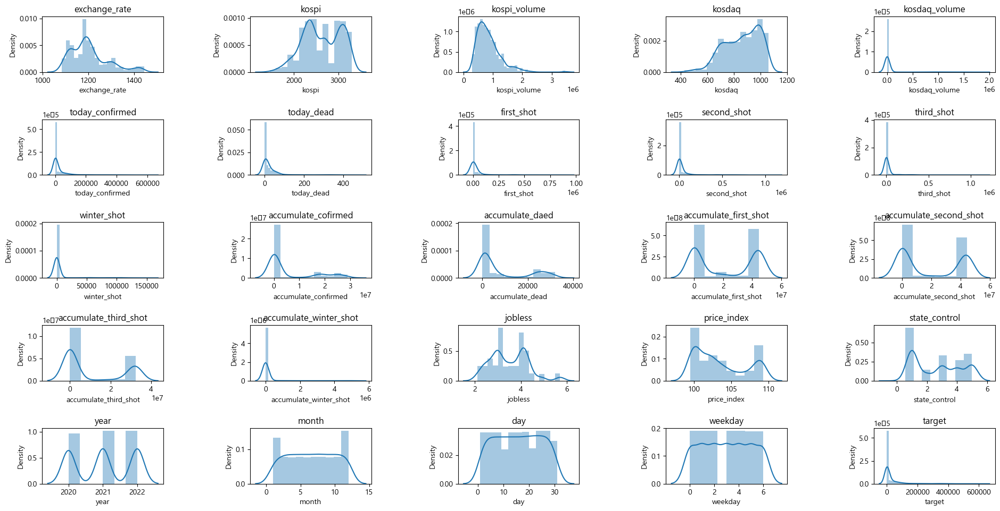

<Figure size 2000x1000 with 0 Axes>

In [111]:
fig, axes = plt.subplots(nrows = 5, ncols = 5)
plt.tight_layout()
plt.figure(figsize = (20,10))
fig.set_size_inches(20, 10)

sns.distplot(total_data["exchange_rate"], ax = axes[0, 0])
sns.distplot(total_data["kospi"], ax = axes[0, 1])
sns.distplot(total_data["kospi_volume"], ax = axes[0, 2])
sns.distplot(total_data["kosdaq"], ax = axes[0, 3])
sns.distplot(total_data["kosdaq_volume"], ax = axes[0, 4])

sns.distplot(total_data["today_confirmed"], ax = axes[1, 0])
sns.distplot(total_data["today_dead"], ax = axes[1, 1])
sns.distplot(total_data["first_shot"], ax = axes[1, 2])
sns.distplot(total_data["second_shot"], ax = axes[1, 3])
sns.distplot(total_data["third_shot"], ax = axes[1, 4])

sns.distplot(total_data["winter_shot"], ax = axes[2, 0])
sns.distplot(total_data["accumulate_confirmed"], ax = axes[2, 1])
sns.distplot(total_data["accumulate_dead"], ax = axes[2, 2])
sns.distplot(total_data["accumulate_first_shot"], ax = axes[2, 3])
sns.distplot(total_data["accumulate_second_shot"], ax = axes[2, 4])

sns.distplot(total_data["accumulate_third_shot"], ax = axes[3, 0])
sns.distplot(total_data["accumulate_winter_shot"], ax = axes[3, 1])
sns.distplot(total_data["jobless"], ax = axes[3, 2])
sns.distplot(total_data["price_index"], ax = axes[3, 3])
sns.distplot(total_data["state_control"], ax = axes[3, 4])

sns.distplot(total_data["year"], ax = axes[4, 0])
sns.distplot(total_data["month"], ax = axes[4, 1])
sns.distplot(total_data["day"], ax = axes[4, 2])
sns.distplot(total_data["weekday"], ax = axes[4, 3])
sns.distplot(total_data["target"], ax = axes[4, 4])

axes[0, 0].set_title("exchange_rate")
axes[0, 1].set_title("kospi")
axes[0, 2].set_title("kospi_volume")
axes[0, 3].set_title("kosdaq")
axes[0, 4].set_title("kosdaq_volume")

axes[1, 0].set_title("today_confirmed")
axes[1, 1].set_title("today_dead")
axes[1, 2].set_title("first_shot")
axes[1, 3].set_title("second_shot")
axes[1, 4].set_title("third_shot")

axes[2, 0].set_title("winter_shot")
axes[2, 1].set_title("accumulate_cofirmed")
axes[2, 2].set_title("accumulate_daed")
axes[2, 3].set_title("accumulate_first_shot")
axes[2, 4].set_title("accumulate_second_shot")

axes[3, 0].set_title("accumulate_third_shot")
axes[3, 1].set_title("accumulate_winter_shot")
axes[3, 2].set_title("jobless")
axes[3, 3].set_title("price_index")
axes[3, 4].set_title("state_control")

axes[4, 0].set_title("year")
axes[4, 1].set_title("month")
axes[4, 2].set_title("day")
axes[4, 3].set_title("weekday")
axes[4, 4].set_title("target")

plt.show()

## 독립성

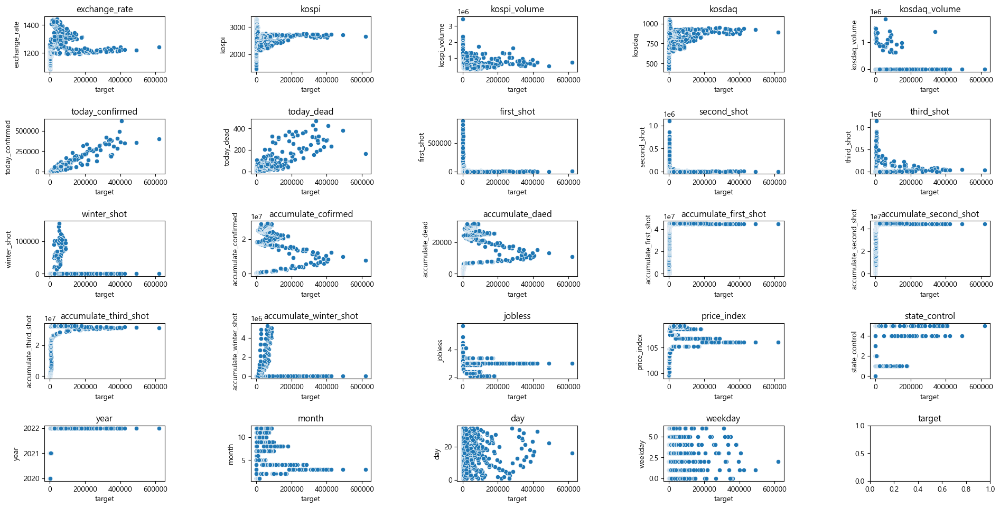

In [112]:
fig, axes = plt.subplots(nrows = 5, ncols = 5)
plt.tight_layout()
fig.set_size_inches(20, 10)

sns.scatterplot(x = "target", y = "exchange_rate", data = total_data, ax = axes[0, 0])
sns.scatterplot(x = "target", y = "kospi", data = total_data, ax = axes[0, 1])
sns.scatterplot(x = "target", y = "kospi_volume", data = total_data, ax = axes[0, 2])
sns.scatterplot(x = "target", y = "kosdaq", data = total_data, ax = axes[0, 3])
sns.scatterplot(x = "target", y = "kosdaq_volume", data = total_data, ax = axes[0, 4])

sns.scatterplot(x = "target", y = "today_confirmed", data = total_data, ax = axes[1, 0])
sns.scatterplot(x = "target", y = "today_dead", data = total_data, ax = axes[1, 1])
sns.scatterplot(x = "target", y = "first_shot", data = total_data, ax = axes[1, 2])
sns.scatterplot(x = "target", y = "second_shot", data = total_data, ax = axes[1, 3])
sns.scatterplot(x = "target", y = "third_shot", data = total_data, ax = axes[1, 4])

sns.scatterplot(x = "target", y = "winter_shot", data = total_data, ax = axes[2, 0])
sns.scatterplot(x = "target", y = "accumulate_confirmed", data = total_data, ax = axes[2, 1])
sns.scatterplot(x = "target", y = "accumulate_dead", data = total_data, ax = axes[2, 2])
sns.scatterplot(x = "target", y = "accumulate_first_shot", data = total_data, ax = axes[2, 3])
sns.scatterplot(x = "target", y = "accumulate_second_shot", data = total_data, ax = axes[2, 4])

sns.scatterplot(x = "target", y = "accumulate_third_shot", data = total_data, ax = axes[3, 0])
sns.scatterplot(x = "target", y = "accumulate_winter_shot", data = total_data, ax = axes[3, 1])
sns.scatterplot(x = "target", y = "jobless", data = total_data, ax = axes[3, 2])
sns.scatterplot(x = "target", y = "price_index", data = total_data, ax = axes[3, 3])
sns.scatterplot(x = "target", y = "state_control", data = total_data, ax = axes[3, 4])

sns.scatterplot(x = "target", y = "year", data = total_data, ax = axes[4, 0])
sns.scatterplot(x = "target", y = "month", data = total_data, ax = axes[4, 1])
sns.scatterplot(x = "target", y = "day", data = total_data, ax = axes[4, 2])
sns.scatterplot(x = "target", y = "weekday", data = total_data, ax = axes[4, 3])

axes[0, 0].set_title("exchange_rate")
axes[0, 1].set_title("kospi")
axes[0, 2].set_title("kospi_volume")
axes[0, 3].set_title("kosdaq")
axes[0, 4].set_title("kosdaq_volume")

axes[1, 0].set_title("today_confirmed")
axes[1, 1].set_title("today_dead")
axes[1, 2].set_title("first_shot")
axes[1, 3].set_title("second_shot")
axes[1, 4].set_title("third_shot")

axes[2, 0].set_title("winter_shot")
axes[2, 1].set_title("accumulate_cofirmed")
axes[2, 2].set_title("accumulate_daed")
axes[2, 3].set_title("accumulate_first_shot")
axes[2, 4].set_title("accumulate_second_shot")

axes[3, 0].set_title("accumulate_third_shot")
axes[3, 1].set_title("accumulate_winter_shot")
axes[3, 2].set_title("jobless")
axes[3, 3].set_title("price_index")
axes[3, 4].set_title("state_control")

axes[4, 0].set_title("year")
axes[4, 1].set_title("month")
axes[4, 2].set_title("day")
axes[4, 3].set_title("weekday")
axes[4, 4].set_title("target")


plt.show()

- 회귀 모델을 적용하기 위해 선형성, 등분산성, 정규성, 독립성을 확인
    - 확인 결과 
        - 4가지 항목에 적용되는 컬럼의 수가 많지 않음
    - 분석 방향
        - 선형성, 등분산성, 정규성, 독립성에 강한 분석 Decision Tree 모델 적용
        - Tree 모델의 최적화를 위해 직관적인 수치를 볼 수 있는 선형회귀 모델 OLS를 통해 최적화

# 시각화

## 범주형 데이터 시각화

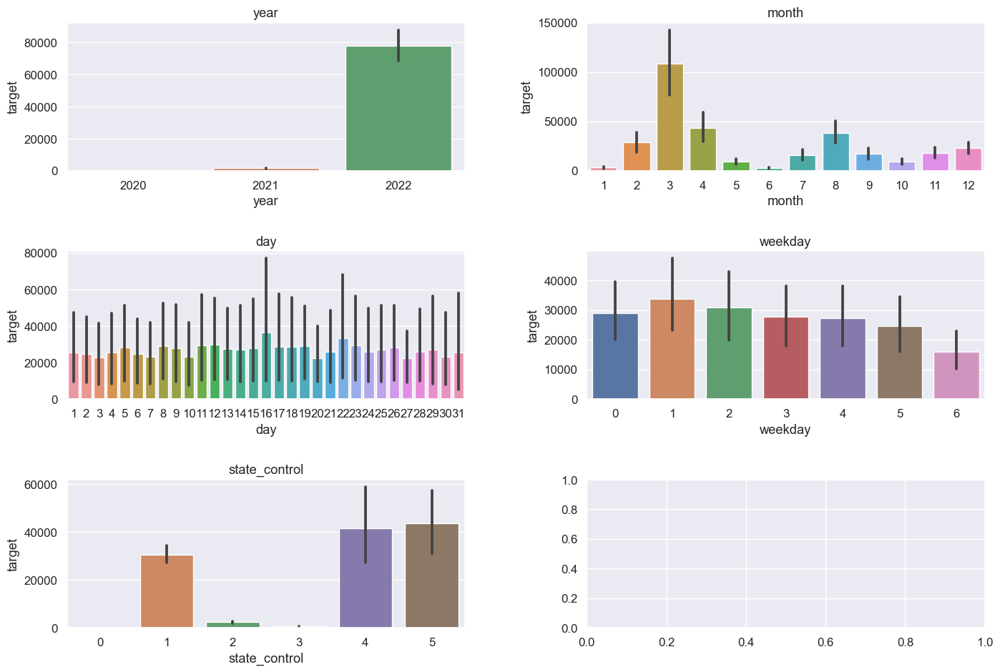

In [113]:
sns.set(font_scale = 1.1)
fig, axes = plt.subplots(nrows = 3, ncols = 2)
plt.tight_layout()
fig.set_size_inches(15, 10)

sns.barplot(x = "year", y = "target", data = total_data, ax = axes[0,0])
sns.barplot(x = "month", y = "target", data = total_data, ax = axes[0,1])
sns.barplot(x = "day", y = "target", data = total_data, ax = axes[1,0])
sns.barplot(x = "weekday", y = "target", data = total_data, ax = axes[1,1])
sns.barplot(x = "state_control", y = "target", data = total_data, ax = axes[2,0])

axes[0, 0].set(title = "year")
axes[0, 1].set(title = "month")
axes[1, 0].set(title = "day")
axes[1, 1].set(title = "weekday")
axes[2, 0].set(title = "state_control")

plt.show()

- 확진자 수는 2021년보다 2022년에 더 많음
- 월별 데이터에서는 3월, 4월, 8월 순으로 확진자가 많음
- 일별 데이터는 일자별로 차이가 크기 때문에 제거
- 요일별 데이터에서 일요일 데이터는 낮게 측정(0 : 월요일 ~ 6 : 일요일)
- 특정 국가 통제(거리두기)에서 높은 target값을 가짐 

In [114]:
total_data = total_data.drop(["day"], axis = 1)
total_data

,exchange_rate,kospi,kospi_volume,kosdaq,kosdaq_volume,today_confirmed,today_dead,first_shot,second_shot,third_shot,...,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control,year,month,weekday,target
0,1160.359985,2262.639893,545500.0,683.469971,1000.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,0,2020,1,0,0.0
1,1157.569946,2239.689941,770300.0,676.520020,1000.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,1,0.0
2,1168.739990,2267.250000,608500.0,688.250000,1000.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,2,0.0
3,1163.729980,2246.129883,509600.0,685.570007,1000.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,3,1.0
4,1167.599976,2246.129883,509600.0,685.570007,1000.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,1279.239990,2317.139893,427600.0,691.250000,1100.0,25530.0,42.0,265.0,238.0,0.0,...,44442402.0,32499099.0,4948756.0,3.0,109.28,1,2022,12,0,87576.0
1072,1275.130005,2332.790039,448300.0,704.190002,900.0,87576.0,50.0,252.0,261.0,0.0,...,44442663.0,32499099.0,5025925.0,3.0,109.28,1,2022,12,1,87491.0
1073,1272.280029,2280.449951,405700.0,692.369995,800.0,87491.0,69.0,261.0,302.0,0.0,...,44442965.0,32499099.0,5095221.0,3.0,109.28,1,2022,12,2,71402.0
1074,1274.319946,2236.399902,361000.0,679.289978,1000.0,71402.0,76.0,249.0,284.0,0.0,...,44443249.0,32499099.0,5167341.0,3.0,109.28,1,2022,12,3,65201.0


## 경제 데이터 시각화

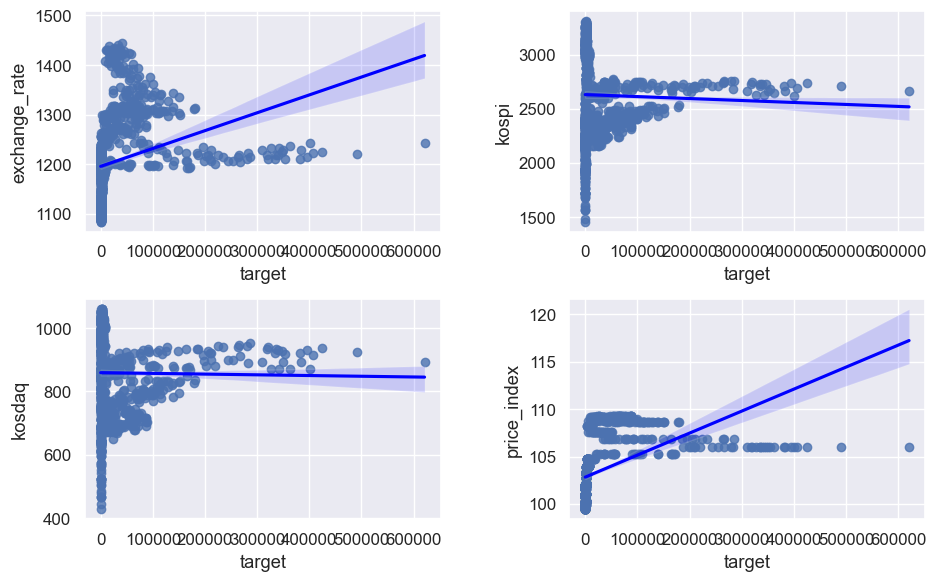

In [115]:
fig, axes = plt.subplots(nrows = 2, ncols = 2)
plt.tight_layout()
fig.set_size_inches(10, 6)

sns.regplot(x = "target", y = "exchange_rate", data = total_data, ax = axes[0, 0], line_kws = {"color" : "blue"})
sns.regplot(x = "target", y = "kospi", data = total_data, ax = axes[0, 1], line_kws = {"color" : "blue"})
sns.regplot(x = "target", y = "kosdaq", data = total_data, ax = axes[1, 0], line_kws = {"color" : "blue"})
sns.regplot(x = "target", y = "price_index", data = total_data, ax = axes[1, 1], line_kws = {"color" : "blue"})

plt.show()

- 코로나 확진자가 증가할 수록 환율과 소비자 물가지수는 커지는 모습을 보임
    - 초기 코로나 시기에는 영향을 많이 받아 낮았지만 이후에는 점차 안정됐기 때문으로 판단됨
- kospi와 kosdaq은 약간 감소하는 추세를 보임

## 코로나 데이터 시각화

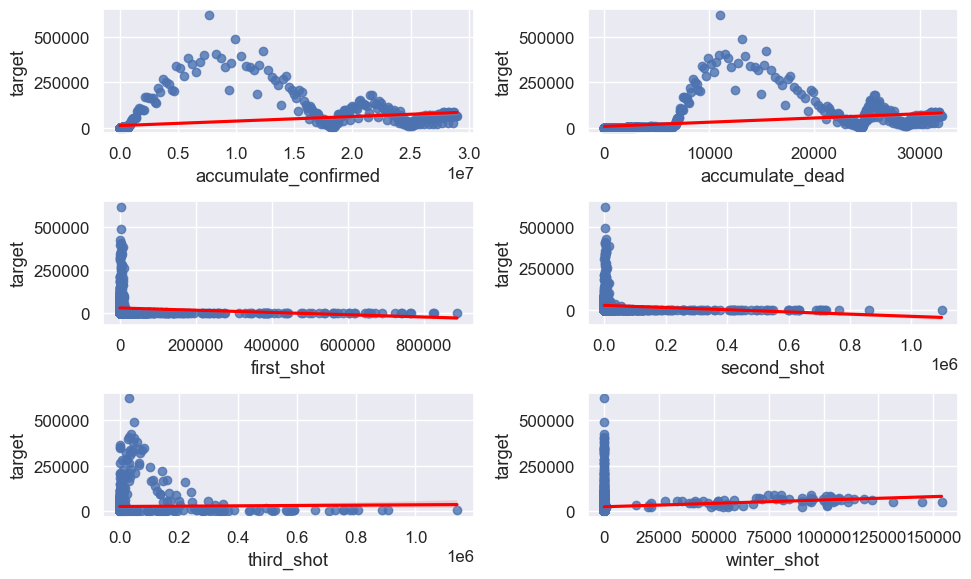

In [116]:
fig, axes = plt.subplots(nrows = 3, ncols = 2)
plt.tight_layout()
fig.set_size_inches(10, 6)

sns.regplot(x = "accumulate_confirmed", y = "target", data = total_data, ax = axes[0, 0], line_kws = {"color" : "red"})
sns.regplot(x = "accumulate_dead", y = "target", data = total_data, ax = axes[0, 1],  line_kws = {"color" : "red"})
sns.regplot(x = "first_shot", y = "target", data = total_data, ax = axes[1, 0], line_kws = {"color" : "red"})
sns.regplot(x = "second_shot", y = "target", data = total_data, ax = axes[1, 1], line_kws = {"color" : "red"})
sns.regplot(x = "third_shot", y = "target", data = total_data, ax = axes[2, 0], line_kws = {"color" : "red"})
sns.regplot(x = "winter_shot", y = "target", data = total_data, ax = axes[2, 1], line_kws = {"color" : "red"})

plt.show()

- 사망자의 경우 확진자가 늘어나면 증가하는 추세를 보임
- 백신 접종은 1,2차는 많은 수가 맞았기 때문에 약하게라도 추세를 보임
    - 백신 접종이 증가하면 약하게 감소하는 추세를 보임

In [117]:
total_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1076 entries, 0 to 1075
Data columns (total 24 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   exchange_rate           1076 non-null   float64
 1   kospi                   1076 non-null   float64
 2   kospi_volume            1076 non-null   float64
 3   kosdaq                  1076 non-null   float64
 4   kosdaq_volume           1076 non-null   float64
 5   today_confirmed         1076 non-null   float64
 6   today_dead              1076 non-null   float64
 7   first_shot              1076 non-null   float64
 8   second_shot             1076 non-null   float64
 9   third_shot              1076 non-null   float64
 10  winter_shot             1076 non-null   float64
 11  accumulate_confirmed    1076 non-null   float64
 12  accumulate_dead         1076 non-null   float64
 13  accumulate_first_shot   1076 non-null   float64
 14  accumulate_second_shot  1076 non-null   

# 베이스 라인 모델

In [118]:
x = total_data.drop(["target"], axis = 1)
y = total_data["target"]

x_train, x_test, y_train, y_test = train_test_split(x, y,
                                                    test_size = .2, random_state = 855)

In [119]:
ols_pvalue_vif(x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.916
Model:                            OLS   Adj. R-squared:                  0.914
Method:                 Least Squares   F-statistic:                     499.5
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:29:13   Log-Likelihood:                -12125.
No. Observations:                1076   AIC:                         2.430e+04
Df Residuals:                    1052   BIC:                         2.442e+04
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                  -1.79

- 0.916의 높은 결정계수를 보이나 다중공선성이 의심됨
    - AIC, BIC, Cond. No. 가 높게 나옴
- 종속 변수가 정규분포가 아니기 때문에 log 적용 필요

In [120]:
regressor_mae(x_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:17<00:00,  1.25s/it]


[('catboost', 3610.122984617273),
 ('extra_tree', 4000.6789767441865),
 ('xgboost', 4461.9019381209855),
 ('gradient_boost', 4887.748852264516),
 ('random_forest', 4938.607383720931),
 ('lightgbm', 5460.666955781802),
 ('baysian_ridge', 6977.364067491444),
 ('ardr_linear', 8520.872079863911),
 ('elasticnet', 8714.689025953954),
 ('lasso', 8953.12454916123),
 ('ridge', 9205.316813841451),
 ('linear', 9219.153406737101),
 ('adaboost', 15396.75161336877),
 ('svr', 26896.627861190365)]

In [121]:
cat = CatBoostRegressor(verbose = False)
cat.fit(x_train, y_train)
cat.score(x_test, y_test)

0.9602503041841515

In [122]:
y_pred = cat.predict(x_test)
y_pred

array([ 55113.,   2811.,   -121.,    460.,   4136.,    532.,   1420.,
           84.,   -101.,    346.,  77491.,    279.,    332.,  42038.,
          695.,     95.,    221.,  -1018.,     15.,    423.,   3373.,
           67.,    274.,  22054.,      3.,    225.,    119.,    -25.,
          397.,   4077.,  12245.,     29.,   6401.,  47778.,   4614.,
       262391.,   1119.,  65252.,  71254., 355156.,      2.,     32.,
          -85.,   6547.,    235.,    706.,  58198.,   -125.,    224.,
           -2.,  35860., 276466.,  53309.,  93575.,   1531., 121926.,
       177160.,   1635.,    828., 168602.,  30734.,    285.,    941.,
         -297.,  22279.,    323.,   1217.,   2407.,    -78.,  54642.,
          399.,    131.,    554.,   -130.,   3846., 128275.,  24224.,
       112516.,   1888.,    766.,    506.,    393.,    343.,     59.,
          226.,   2052.,   4183.,     49.,    375.,    566.,    350.,
        51154.,    893.,   1646.,  79794.,    777.,  19123.,  10740.,
          716.,    5

In [123]:
# 타겟 값, 예측 값 시각화
hist_data = [y_test, y_pred]

labels = ["y_test", "y_pred"]

fig = ff.create_distplot(hist_data, labels, show_hist = False, show_rug = False)
fig.show()

- MAE가 3803가 나오는 Catboost를 사용해 0.960의 결정계수가 나왔지만 앞서 봤던 부분에서 다중공선성의 의심돼 데이터 처리 후 적용

# 종속변수 시각화

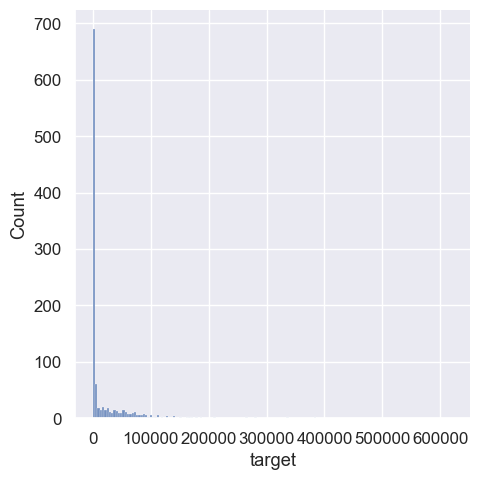

In [124]:
sns.displot(total_data["target"])
plt.show()

- 0이하의 특정값이 많은 숫자를 가지고 있음
    - log를 통한 정규분포 모형 적용

## log를 통한 정규분포 모형

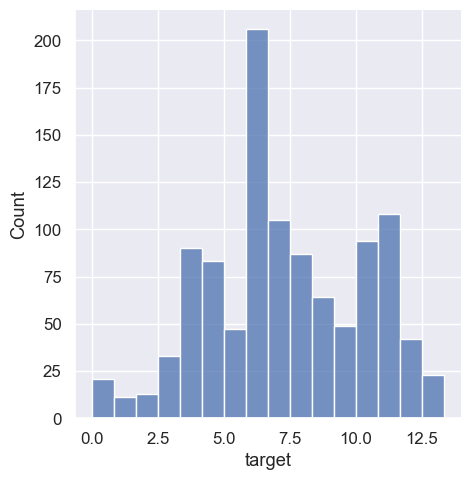

In [125]:
sns.displot(np.log1p(total_data["target"]))
plt.show()

- 독립변수 간의 단위가 다르기 때문에 scale적용 필요
- log와 같이 적용

# 스케일링

In [126]:
x = total_data.drop(["target"], axis = 1)
y = np.log1p(total_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                    test_size = .2, random_state = 855)

In [127]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.940
Model:                            OLS   Adj. R-squared:                  0.938
Method:                 Least Squares   F-statistic:                     714.1
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:29:48   Log-Likelihood:                -1168.0
No. Observations:                1076   AIC:                             2384.
Df Residuals:                    1052   BIC:                             2504.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [128]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:18<00:00,  1.35s/it]


[('catboost', 0.1721357414157419),
 ('extra_tree', 0.1766267207571793),
 ('lightgbm', 0.17929804492466855),
 ('gradient_boost', 0.17996572167062166),
 ('random_forest', 0.19084973184028756),
 ('xgboost', 0.19146102810735258),
 ('adaboost', 0.2710601034455378),
 ('svr', 0.4069794118725751),
 ('ardr_linear', 0.5407353710260672),
 ('ridge', 0.5451587101077237),
 ('linear', 0.546261299317685),
 ('baysian_ridge', 0.5467196220280538),
 ('elasticnet', 0.9314815205012283),
 ('lasso', 1.1696019850424115)]

In [129]:
# 검증데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1721357414157419
test_cv MAE : 0.2621782806438281
R-squared : 0.99270, MAE: 4167.036, SMAPE:  9.138, MSE:  163238071.308 RMSE: 12776.466, RMSLE: 0.248


In [130]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1721357414157419
test_cv MAE : 0.2621782806438281
R-squared : 0.99365, MAE: 3058.235, SMAPE:  8.373, MSE:  105614158.706 RMSE: 10276.875, RMSLE: 0.231


In [131]:
cat.feature_importances_

array([ 3.,  6.,  1.,  3.,  1., 28.,  2.,  1.,  1.,  0.,  0.,  8.,  7.,
        4.,  4., 11.,  0.,  2.,  3.,  4.,  4.,  3.,  1.])

In [132]:
print(pd.DataFrame({"feature" : x.columns, "importance" : cat.feature_importances_}).sort_values("importance", ascending=False))

                   feature  importance
5          today_confirmed   27.881141
15   accumulate_third_shot   11.049031
11    accumulate_confirmed    8.224276
12         accumulate_dead    6.707316
1                    kospi    6.215111
13   accumulate_first_shot    4.358063
20                    year    4.296218
19           state_control    4.006429
14  accumulate_second_shot    3.812205
21                   month    3.397609
18             price_index    3.278785
3                   kosdaq    3.150521
0            exchange_rate    2.916305
6               today_dead    2.451311
17                 jobless    2.165350
22                 weekday    1.475938
2             kospi_volume    1.280056
7               first_shot    1.106266
8              second_shot    0.966623
4            kosdaq_volume    0.509336
9               third_shot    0.489058
16  accumulate_winter_shot    0.192114
10             winter_shot    0.070938


- 다중공선성이 높은 컬럼들이 보이기 때문에 일부 컬럼 제거 필요
    - Target과 상관관계가 있는 컬럼 확인
    - VIF가 높은 컬럼 확인 필요

# 컬럼 별 상관관계

In [133]:
total_data["target"] = np.log1p(total_data["target"])

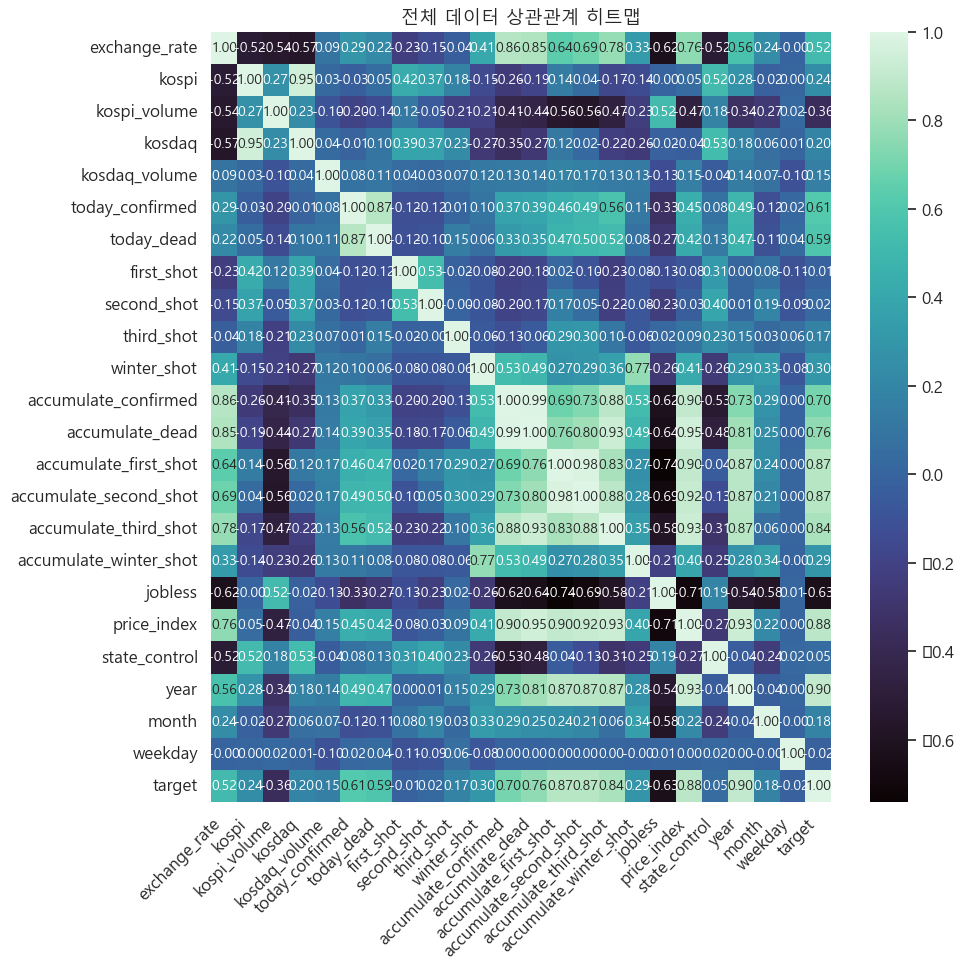

In [135]:
plt.figure(figsize = (10, 10))

ax = sns.heatmap(total_data.corr(),
            annot = True,
            fmt = ".2f",
            cmap = "mako",
            annot_kws={"size": 10})

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)

plt.title("전체 데이터 상관관계 히트맵")

plt.show()

- 상관관계가 0.3이하에 영향을 미치지 않는 컬럼을 제거
    - kospi 0.24
    - kosdaq 0.20
    - kosdaq_volume 0.15
    - first_shot -0.01
    - second_shot 0.02
    - third_shot 0.17
    - winter_shot 0.30
    - accumulate_winter_shot 0.29
    - state_control 0.05
    - month 0.18
    - weekday -0.02

In [136]:
# 상관관계를 위해 log한 target 복귀
total_data["target"] = np.expm1(total_data["target"])

# target과 상관관계가 0.3이하 컬럼 제거

In [137]:
cor_total_data = total_data.drop(["kospi", "kosdaq", "kosdaq_volume", "first_shot", "second_shot",  "third_shot", "winter_shot",
                                  "accumulate_winter_shot", "state_control", "month", "weekday"], axis = 1)
cor_total_data

,exchange_rate,kospi_volume,today_confirmed,today_dead,accumulate_confirmed,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,jobless,price_index,year,target
0,1160.359985,545500.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,4.1,100.09,2020,0.0
1,1157.569946,770300.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,4.1,100.09,2020,0.0
2,1168.739990,608500.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,4.1,100.09,2020,0.0
3,1163.729980,509600.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,4.1,100.09,2020,1.0
4,1167.599976,509600.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,4.1,100.09,2020,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,1279.239990,427600.0,25530.0,42.0,28684374.0,31832.0,44861882.0,44442402.0,32499099.0,3.0,109.28,2022,87576.0
1072,1275.130005,448300.0,87576.0,50.0,28771950.0,31882.0,44862134.0,44442663.0,32499099.0,3.0,109.28,2022,87491.0
1073,1272.280029,405700.0,87491.0,69.0,28859441.0,31951.0,44862395.0,44442965.0,32499099.0,3.0,109.28,2022,71402.0
1074,1274.319946,361000.0,71402.0,76.0,28930843.0,32027.0,44862644.0,44443249.0,32499099.0,3.0,109.28,2022,65201.0


## 0.3이하 제거 후 모델

In [138]:
x = cor_total_data.drop(["target"], axis = 1)
y = np.log1p(cor_total_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                    test_size = .2, random_state = 855)

In [139]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.902
Model:                            OLS   Adj. R-squared:                  0.900
Method:                 Least Squares   F-statistic:                     811.7
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:31:52   Log-Likelihood:                -1432.3
No. Observations:                1076   AIC:                             2891.
Df Residuals:                    1063   BIC:                             2955.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [140]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:13<00:00,  1.06it/s]


[('extra_tree', 0.2292933041273788),
 ('random_forest', 0.2382168362427198),
 ('catboost', 0.23975642984578274),
 ('lightgbm', 0.24303569628100083),
 ('gradient_boost', 0.24343876466185158),
 ('xgboost', 0.272979322623911),
 ('adaboost', 0.2772365897056381),
 ('svr', 0.4665068445102184),
 ('linear', 0.6061913631117989),
 ('ridge', 0.6120414296577636),
 ('baysian_ridge', 0.6145177081788076),
 ('ardr_linear', 0.617596500314496),
 ('elasticnet', 0.9363810140869158),
 ('lasso', 1.1696019850424115)]

In [141]:
model_result("ext", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.2289951872950146
test_cv MAE : 0.27009265661472487
R-squared : 0.98971, MAE: 6500.411, SMAPE:  11.546, MSE:  513812290.584 RMSE: 22667.428, RMSLE: 0.295


In [142]:
ext = ExtraTreesRegressor()
ext.fit(scaled_train, y_train)
ext.score(scaled_test, y_test)

0.989099966287204

In [143]:
ext.feature_importances_

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [144]:
print(pd.DataFrame({"feature" : x.columns, "importance" : ext.feature_importances_}).sort_values("importance", ascending=False))

                   feature  importance
7   accumulate_second_shot    0.345426
6    accumulate_first_shot    0.181671
2          today_confirmed    0.098342
11                    year    0.089046
5          accumulate_dead    0.088186
8    accumulate_third_shot    0.086057
10             price_index    0.055139
4     accumulate_confirmed    0.026804
0            exchange_rate    0.010680
3               today_dead    0.010197
9                  jobless    0.006074
1             kospi_volume    0.002378


- 다중공선성 수치가 많이 줄어들었으나 아직 111로 높은 수치를 보임
    - VIF 수치가 높은 컬럼 제거
        - exchange_rate 549.2

# exchange_rate 제거

In [145]:
cor_total_data = cor_total_data.drop(["exchange_rate"], axis = 1)
cor_total_data

,kospi_volume,today_confirmed,today_dead,accumulate_confirmed,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,jobless,price_index,year,target
0,545500.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,4.1,100.09,2020,0.0
1,770300.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,4.1,100.09,2020,0.0
2,608500.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,4.1,100.09,2020,0.0
3,509600.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,4.1,100.09,2020,1.0
4,509600.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,4.1,100.09,2020,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1071,427600.0,25530.0,42.0,28684374.0,31832.0,44861882.0,44442402.0,32499099.0,3.0,109.28,2022,87576.0
1072,448300.0,87576.0,50.0,28771950.0,31882.0,44862134.0,44442663.0,32499099.0,3.0,109.28,2022,87491.0
1073,405700.0,87491.0,69.0,28859441.0,31951.0,44862395.0,44442965.0,32499099.0,3.0,109.28,2022,71402.0
1074,361000.0,71402.0,76.0,28930843.0,32027.0,44862644.0,44443249.0,32499099.0,3.0,109.28,2022,65201.0


In [146]:
x = cor_total_data.drop(["target"], axis = 1)
y = np.log1p(cor_total_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                    test_size = .2, random_state = 855)

In [147]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.889
Model:                            OLS   Adj. R-squared:                  0.888
Method:                 Least Squares   F-statistic:                     773.0
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:32:17   Log-Likelihood:                -1498.2
No. Observations:                1076   AIC:                             3020.
Df Residuals:                    1064   BIC:                             3080.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [148]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:11<00:00,  1.20it/s]


[('extra_tree', 0.22686938639247461),
 ('random_forest', 0.23675291859962572),
 ('catboost', 0.23860514972870064),
 ('lightgbm', 0.24189906282020224),
 ('gradient_boost', 0.2421570314346341),
 ('xgboost', 0.2673775342375084),
 ('adaboost', 0.2780094418057349),
 ('svr', 0.5022639943951894),
 ('ridge', 0.6460036560498097),
 ('baysian_ridge', 0.6465368966693074),
 ('ardr_linear', 0.6470173222137333),
 ('linear', 0.6476864369233656),
 ('elasticnet', 0.9363804092620903),
 ('lasso', 1.1696028873369435)]

In [149]:
model_result("ext", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.22685700484186308
test_cv MAE : 0.26565143858767243
R-squared : 0.98895, MAE: 6731.063, SMAPE:  11.774, MSE:  549845598.312 RMSE: 23448.787, RMSLE: 0.305


In [150]:
ext = ExtraTreesRegressor()
ext.fit(scaled_train, y_train)
ext.score(scaled_test, y_test)

0.9892724309477102

In [151]:
ext.feature_importances_

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [152]:
print(pd.DataFrame({"feature" : x.columns, "importance" : ext.feature_importances_}).sort_values("importance", ascending=False))

                   feature  importance
6   accumulate_second_shot    0.296710
5    accumulate_first_shot    0.174980
7    accumulate_third_shot    0.134268
1          today_confirmed    0.111284
9              price_index    0.083228
10                    year    0.081560
4          accumulate_dead    0.062209
3     accumulate_confirmed    0.035836
2               today_dead    0.010593
8                  jobless    0.006491
0             kospi_volume    0.002841


- 아직 97.9로 높은 수치를 보임
    - VIF 수치가 높은 컬럼 제거
        - kospi_volume 431.2

# kospi_volume 제거

In [153]:
cor_total_data = cor_total_data.drop(["kospi_volume"], axis = 1)
cor_total_data

,today_confirmed,today_dead,accumulate_confirmed,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,jobless,price_index,year,target
0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,4.1,100.09,2020,0.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,4.1,100.09,2020,0.0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,4.1,100.09,2020,0.0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,4.1,100.09,2020,1.0
4,1.0,0.0,2.0,0.0,0.0,0.0,0.0,4.1,100.09,2020,0.0
...,...,...,...,...,...,...,...,...,...,...,...
1071,25530.0,42.0,28684374.0,31832.0,44861882.0,44442402.0,32499099.0,3.0,109.28,2022,87576.0
1072,87576.0,50.0,28771950.0,31882.0,44862134.0,44442663.0,32499099.0,3.0,109.28,2022,87491.0
1073,87491.0,69.0,28859441.0,31951.0,44862395.0,44442965.0,32499099.0,3.0,109.28,2022,71402.0
1074,71402.0,76.0,28930843.0,32027.0,44862644.0,44443249.0,32499099.0,3.0,109.28,2022,65201.0


In [154]:
x = cor_total_data.drop(["target"], axis = 1)
y = np.log1p(cor_total_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                    test_size = .2, random_state = 855)

In [155]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.887
Model:                            OLS   Adj. R-squared:                  0.886
Method:                 Least Squares   F-statistic:                     833.3
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:32:35   Log-Likelihood:                -1508.3
No. Observations:                1076   AIC:                             3039.
Df Residuals:                    1065   BIC:                             3093.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [156]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:10<00:00,  1.29it/s]


[('extra_tree', 0.22689797198080383),
 ('catboost', 0.2309302945805048),
 ('lightgbm', 0.2343478808699062),
 ('random_forest', 0.236855042392372),
 ('gradient_boost', 0.24123172692807437),
 ('xgboost', 0.26043930259618986),
 ('adaboost', 0.28727496662304064),
 ('svr', 0.500755551842368),
 ('ardr_linear', 0.6418158919307725),
 ('baysian_ridge', 0.6439039425289986),
 ('ridge', 0.6442652106398395),
 ('linear', 0.6470086268762453),
 ('elasticnet', 0.9363797955517764),
 ('lasso', 1.1696026666468669)]

In [157]:
model_result("ext", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.22704526480997567
test_cv MAE : 0.27861791837773897
R-squared : 0.98546, MAE: 6543.791, SMAPE:  11.915, MSE:  541985452.638 RMSE: 23280.581, RMSLE: 0.350


In [158]:
ext = ExtraTreesRegressor()
ext.fit(scaled_train, y_train)
ext.score(scaled_test, y_test)

0.9858631674446455

In [159]:
print(pd.DataFrame({"feature" : x.columns, "importance" : ext.feature_importances_}).sort_values("importance", ascending=False))

                  feature  importance
5  accumulate_second_shot    0.311908
4   accumulate_first_shot    0.150116
6   accumulate_third_shot    0.137704
8             price_index    0.112473
0         today_confirmed    0.107124
9                    year    0.067604
3         accumulate_dead    0.059754
2    accumulate_confirmed    0.037585
1              today_dead    0.008800
7                 jobless    0.006932


- **더이상의 컬럼을 제거해도 성능이 향상되는 모델을 볼 수 없다고 판단**
    - MAE의 수치는 6000이상의 값이 나오고 R-Squered가 점차 하락

# 상관계수 컬럼 제외가 아닌 p-value 값 적용 제외

In [160]:
total_data

,exchange_rate,kospi,kospi_volume,kosdaq,kosdaq_volume,today_confirmed,today_dead,first_shot,second_shot,third_shot,...,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control,year,month,weekday,target
0,1160.359985,2262.639893,545500.0,683.469971,1000.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,0,2020,1,0,0.0
1,1157.569946,2239.689941,770300.0,676.520020,1000.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,1,0.0
2,1168.739990,2267.250000,608500.0,688.250000,1000.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,2,0.0
3,1163.729980,2246.129883,509600.0,685.570007,1000.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,3,1.0
4,1167.599976,2246.129883,509600.0,685.570007,1000.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,1279.239990,2317.139893,427600.0,691.250000,1100.0,25530.0,42.0,265.0,238.0,0.0,...,44442402.0,32499099.0,4948756.0,3.0,109.28,1,2022,12,0,87576.0
1072,1275.130005,2332.790039,448300.0,704.190002,900.0,87576.0,50.0,252.0,261.0,0.0,...,44442663.0,32499099.0,5025925.0,3.0,109.28,1,2022,12,1,87491.0
1073,1272.280029,2280.449951,405700.0,692.369995,800.0,87491.0,69.0,261.0,302.0,0.0,...,44442965.0,32499099.0,5095221.0,3.0,109.28,1,2022,12,2,71402.0
1074,1274.319946,2236.399902,361000.0,679.289978,1000.0,71402.0,76.0,249.0,284.0,0.0,...,44443249.0,32499099.0,5167341.0,3.0,109.28,1,2022,12,3,65201.0


In [161]:
x = total_data.drop(["target"], axis = 1)
y = np.log1p(total_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                    test_size = .2, random_state = 855)

In [162]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.940
Model:                            OLS   Adj. R-squared:                  0.938
Method:                 Least Squares   F-statistic:                     714.1
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:32:56   Log-Likelihood:                -1168.0
No. Observations:                1076   AIC:                             2384.
Df Residuals:                    1052   BIC:                             2504.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [163]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:19<00:00,  1.36s/it]


[('catboost', 0.1721357414157419),
 ('extra_tree', 0.1757157590107893),
 ('lightgbm', 0.17929804492466855),
 ('gradient_boost', 0.17974491548911078),
 ('random_forest', 0.1899196344067192),
 ('xgboost', 0.19146102810735258),
 ('adaboost', 0.26891195576938115),
 ('svr', 0.4069794118725751),
 ('ardr_linear', 0.5407353710260672),
 ('ridge', 0.5451587101077237),
 ('linear', 0.546261299317685),
 ('baysian_ridge', 0.5467196220280538),
 ('elasticnet', 0.9314815205012283),
 ('lasso', 1.1696019850424115)]

In [164]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1721357414157419
test_cv MAE : 0.2621782806438281
R-squared : 0.99288, MAE: 4254.928, SMAPE:  9.129, MSE:  196864525.157 RMSE: 14030.842, RMSLE: 0.245


In [165]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1721357414157419
test_cv MAE : 0.2621782806438281
R-squared : 0.99365, MAE: 3058.235, SMAPE:  8.373, MSE:  105614158.706 RMSE: 10276.875, RMSLE: 0.231


- accumulate_confirmed 제거
    - p-value값이 0.977

## accumulate_confirmed 제거

In [166]:
total_data = total_data.drop("accumulate_confirmed", axis = 1)
total_data

,exchange_rate,kospi,kospi_volume,kosdaq,kosdaq_volume,today_confirmed,today_dead,first_shot,second_shot,third_shot,...,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control,year,month,weekday,target
0,1160.359985,2262.639893,545500.0,683.469971,1000.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,0,2020,1,0,0.0
1,1157.569946,2239.689941,770300.0,676.520020,1000.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,1,0.0
2,1168.739990,2267.250000,608500.0,688.250000,1000.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,2,0.0
3,1163.729980,2246.129883,509600.0,685.570007,1000.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,3,1.0
4,1167.599976,2246.129883,509600.0,685.570007,1000.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,1279.239990,2317.139893,427600.0,691.250000,1100.0,25530.0,42.0,265.0,238.0,0.0,...,44442402.0,32499099.0,4948756.0,3.0,109.28,1,2022,12,0,87576.0
1072,1275.130005,2332.790039,448300.0,704.190002,900.0,87576.0,50.0,252.0,261.0,0.0,...,44442663.0,32499099.0,5025925.0,3.0,109.28,1,2022,12,1,87491.0
1073,1272.280029,2280.449951,405700.0,692.369995,800.0,87491.0,69.0,261.0,302.0,0.0,...,44442965.0,32499099.0,5095221.0,3.0,109.28,1,2022,12,2,71402.0
1074,1274.319946,2236.399902,361000.0,679.289978,1000.0,71402.0,76.0,249.0,284.0,0.0,...,44443249.0,32499099.0,5167341.0,3.0,109.28,1,2022,12,3,65201.0


In [167]:
x = total_data.drop(["target"], axis = 1)
y = np.log1p(total_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                    test_size = .2, random_state = 855)

In [168]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.940
Model:                            OLS   Adj. R-squared:                  0.939
Method:                 Least Squares   F-statistic:                     747.2
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:34:30   Log-Likelihood:                -1168.0
No. Observations:                1076   AIC:                             2382.
Df Residuals:                    1053   BIC:                             2497.
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [169]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:18<00:00,  1.31s/it]


[('catboost', 0.17556815803106907),
 ('extra_tree', 0.17578397061218115),
 ('lightgbm', 0.17881879729187652),
 ('gradient_boost', 0.1791031680835942),
 ('random_forest', 0.18997794271526042),
 ('xgboost', 0.1923763342905724),
 ('adaboost', 0.26969061084134477),
 ('svr', 0.4061947298655271),
 ('ardr_linear', 0.5406188477117052),
 ('linear', 0.5436485515148017),
 ('ridge', 0.544864316207645),
 ('baysian_ridge', 0.5463991056700046),
 ('elasticnet', 0.9314809323357695),
 ('lasso', 1.1696028557534313)]

In [170]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17556815803106907
test_cv MAE : 0.25730180776350553
R-squared : 0.99385, MAE: 3712.584, SMAPE:  9.481, MSE:  146768600.320 RMSE: 12114.809, RMSLE: 0.228


In [171]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17556815803106907
test_cv MAE : 0.25730180776350553
R-squared : 0.99450, MAE: 3301.556, SMAPE:  8.368, MSE:  140570794.198 RMSE: 11856.255, RMSLE: 0.215


- kosdaq 컬럼 제거
    - p_value가 0.978

## kosdaq 제거

In [172]:
total_data = total_data.drop("kosdaq", axis = 1)
total_data

,exchange_rate,kospi,kospi_volume,kosdaq_volume,today_confirmed,today_dead,first_shot,second_shot,third_shot,winter_shot,...,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control,year,month,weekday,target
0,1160.359985,2262.639893,545500.0,1000.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,0,2020,1,0,0.0
1,1157.569946,2239.689941,770300.0,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,1,0.0
2,1168.739990,2267.250000,608500.0,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,2,0.0
3,1163.729980,2246.129883,509600.0,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,3,1.0
4,1167.599976,2246.129883,509600.0,1000.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,1279.239990,2317.139893,427600.0,1100.0,25530.0,42.0,265.0,238.0,0.0,74757.0,...,44442402.0,32499099.0,4948756.0,3.0,109.28,1,2022,12,0,87576.0
1072,1275.130005,2332.790039,448300.0,900.0,87576.0,50.0,252.0,261.0,0.0,77169.0,...,44442663.0,32499099.0,5025925.0,3.0,109.28,1,2022,12,1,87491.0
1073,1272.280029,2280.449951,405700.0,800.0,87491.0,69.0,261.0,302.0,0.0,69296.0,...,44442965.0,32499099.0,5095221.0,3.0,109.28,1,2022,12,2,71402.0
1074,1274.319946,2236.399902,361000.0,1000.0,71402.0,76.0,249.0,284.0,0.0,72120.0,...,44443249.0,32499099.0,5167341.0,3.0,109.28,1,2022,12,3,65201.0


In [173]:
x = total_data.drop(["target"], axis = 1)
y = np.log1p(total_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                    test_size = .2, random_state = 855)

In [174]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.940
Model:                            OLS   Adj. R-squared:                  0.939
Method:                 Least Squares   F-statistic:                     783.5
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:35:32   Log-Likelihood:                -1168.0
No. Observations:                1076   AIC:                             2380.
Df Residuals:                    1054   BIC:                             2490.
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [175]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:17<00:00,  1.26s/it]


[('catboost', 0.17405134543209738),
 ('extra_tree', 0.17744640507045403),
 ('lightgbm', 0.17986353931252938),
 ('gradient_boost', 0.180542680500819),
 ('xgboost', 0.18917332829093772),
 ('random_forest', 0.1904040377448883),
 ('adaboost', 0.26722558322565987),
 ('svr', 0.40813513976932125),
 ('ardr_linear', 0.5410980227555656),
 ('linear', 0.5425303960410199),
 ('ridge', 0.5438185944188876),
 ('baysian_ridge', 0.545010547180895),
 ('elasticnet', 0.9315369353915172),
 ('lasso', 1.1696028557534313)]

In [176]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17405134543209738
test_cv MAE : 0.2702507682807366
R-squared : 0.99354, MAE: 3736.816, SMAPE:  9.477, MSE:  133432638.542 RMSE: 11551.305, RMSLE: 0.233


In [177]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17405134543209738
test_cv MAE : 0.2702507682807366
R-squared : 0.99420, MAE: 3537.341, SMAPE:  8.694, MSE:  139825766.590 RMSE: 11824.795, RMSLE: 0.221


- today_dead 컬럼 제거
    - p-value 0.89

## today_dead 제거

In [178]:
total_data = total_data.drop("today_dead", axis = 1)
total_data

,exchange_rate,kospi,kospi_volume,kosdaq_volume,today_confirmed,first_shot,second_shot,third_shot,winter_shot,accumulate_dead,...,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control,year,month,weekday,target
0,1160.359985,2262.639893,545500.0,1000.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,0,2020,1,0,0.0
1,1157.569946,2239.689941,770300.0,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,1,0.0
2,1168.739990,2267.250000,608500.0,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,2,0.0
3,1163.729980,2246.129883,509600.0,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,3,1.0
4,1167.599976,2246.129883,509600.0,1000.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,1279.239990,2317.139893,427600.0,1100.0,25530.0,265.0,238.0,0.0,74757.0,31832.0,...,44442402.0,32499099.0,4948756.0,3.0,109.28,1,2022,12,0,87576.0
1072,1275.130005,2332.790039,448300.0,900.0,87576.0,252.0,261.0,0.0,77169.0,31882.0,...,44442663.0,32499099.0,5025925.0,3.0,109.28,1,2022,12,1,87491.0
1073,1272.280029,2280.449951,405700.0,800.0,87491.0,261.0,302.0,0.0,69296.0,31951.0,...,44442965.0,32499099.0,5095221.0,3.0,109.28,1,2022,12,2,71402.0
1074,1274.319946,2236.399902,361000.0,1000.0,71402.0,249.0,284.0,0.0,72120.0,32027.0,...,44443249.0,32499099.0,5167341.0,3.0,109.28,1,2022,12,3,65201.0


In [179]:
x = total_data.drop(["target"], axis = 1)
y = np.log1p(total_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                    test_size = .2, random_state = 855)

In [180]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.940
Model:                            OLS   Adj. R-squared:                  0.939
Method:                 Least Squares   F-statistic:                     823.5
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:36:33   Log-Likelihood:                -1168.0
No. Observations:                1076   AIC:                             2378.
Df Residuals:                    1055   BIC:                             2483.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [181]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:17<00:00,  1.22s/it]


[('catboost', 0.17105648377507313),
 ('extra_tree', 0.1737585770386792),
 ('gradient_boost', 0.1787230630470809),
 ('lightgbm', 0.17945198227736434),
 ('random_forest', 0.18792526663203885),
 ('xgboost', 0.18914216357879965),
 ('adaboost', 0.2682947033144067),
 ('svr', 0.41459596351399364),
 ('ardr_linear', 0.5410758382840811),
 ('linear', 0.5421590652600848),
 ('ridge', 0.5428710198473111),
 ('baysian_ridge', 0.5438022621697678),
 ('elasticnet', 0.9373645562596863),
 ('lasso', 1.1696026436075362)]

In [182]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17105648377507313
test_cv MAE : 0.27633323414923056
R-squared : 0.99331, MAE: 3746.055, SMAPE:  10.003, MSE:  130753331.585 RMSE: 11434.742, RMSLE: 0.238


In [183]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17105648377507313
test_cv MAE : 0.27633323414923056
R-squared : 0.99419, MAE: 3024.033, SMAPE:  8.795, MSE:  110012636.351 RMSE: 10488.691, RMSLE: 0.221


- third_shot 제거
    - p-value가 0.858

## third_shot 제거

In [184]:
total_data = total_data.drop("third_shot", axis = 1)
total_data

,exchange_rate,kospi,kospi_volume,kosdaq_volume,today_confirmed,first_shot,second_shot,winter_shot,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control,year,month,weekday,target
0,1160.359985,2262.639893,545500.0,1000.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,0,2020,1,0,0.0
1,1157.569946,2239.689941,770300.0,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,1,0.0
2,1168.739990,2267.250000,608500.0,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,2,0.0
3,1163.729980,2246.129883,509600.0,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,3,1.0
4,1167.599976,2246.129883,509600.0,1000.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,1279.239990,2317.139893,427600.0,1100.0,25530.0,265.0,238.0,74757.0,31832.0,44861882.0,44442402.0,32499099.0,4948756.0,3.0,109.28,1,2022,12,0,87576.0
1072,1275.130005,2332.790039,448300.0,900.0,87576.0,252.0,261.0,77169.0,31882.0,44862134.0,44442663.0,32499099.0,5025925.0,3.0,109.28,1,2022,12,1,87491.0
1073,1272.280029,2280.449951,405700.0,800.0,87491.0,261.0,302.0,69296.0,31951.0,44862395.0,44442965.0,32499099.0,5095221.0,3.0,109.28,1,2022,12,2,71402.0
1074,1274.319946,2236.399902,361000.0,1000.0,71402.0,249.0,284.0,72120.0,32027.0,44862644.0,44443249.0,32499099.0,5167341.0,3.0,109.28,1,2022,12,3,65201.0


In [185]:
x = total_data.drop(["target"], axis = 1)
y = np.log1p(total_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                    test_size = .2, random_state = 855)

In [186]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.940
Model:                            OLS   Adj. R-squared:                  0.939
Method:                 Least Squares   F-statistic:                     867.6
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:37:30   Log-Likelihood:                -1168.0
No. Observations:                1076   AIC:                             2376.
Df Residuals:                    1056   BIC:                             2476.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [187]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:15<00:00,  1.13s/it]


[('catboost', 0.1739832085386813),
 ('extra_tree', 0.17640664024812897),
 ('lightgbm', 0.17863917625235642),
 ('gradient_boost', 0.1846658342395289),
 ('random_forest', 0.1898290534865236),
 ('xgboost', 0.19274734570319715),
 ('adaboost', 0.27222812589208634),
 ('svr', 0.41695667329003516),
 ('ardr_linear', 0.541311015056378),
 ('linear', 0.5413184504998192),
 ('ridge', 0.5423098047792425),
 ('baysian_ridge', 0.5430157205449871),
 ('elasticnet', 0.9373645562596863),
 ('lasso', 1.1696026436075362)]

In [188]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1739832085386813
test_cv MAE : 0.2685071420151293
R-squared : 0.99376, MAE: 3887.885, SMAPE:  9.130, MSE:  173967491.495 RMSE: 13189.674, RMSLE: 0.229


In [189]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1739832085386813
test_cv MAE : 0.2685071420151293
R-squared : 0.99382, MAE: 3928.619, SMAPE:  8.889, MSE:  196738849.575 RMSE: 14026.363, RMSLE: 0.228


- winter_shot 제거
    - p-value가 0.804

## winter_shot 제거

In [190]:
total_data = total_data.drop("winter_shot", axis = 1)
total_data

,exchange_rate,kospi,kospi_volume,kosdaq_volume,today_confirmed,first_shot,second_shot,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control,year,month,weekday,target
0,1160.359985,2262.639893,545500.0,1000.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,0,2020,1,0,0.0
1,1157.569946,2239.689941,770300.0,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,1,0.0
2,1168.739990,2267.250000,608500.0,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,2,0.0
3,1163.729980,2246.129883,509600.0,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,3,1.0
4,1167.599976,2246.129883,509600.0,1000.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,1279.239990,2317.139893,427600.0,1100.0,25530.0,265.0,238.0,31832.0,44861882.0,44442402.0,32499099.0,4948756.0,3.0,109.28,1,2022,12,0,87576.0
1072,1275.130005,2332.790039,448300.0,900.0,87576.0,252.0,261.0,31882.0,44862134.0,44442663.0,32499099.0,5025925.0,3.0,109.28,1,2022,12,1,87491.0
1073,1272.280029,2280.449951,405700.0,800.0,87491.0,261.0,302.0,31951.0,44862395.0,44442965.0,32499099.0,5095221.0,3.0,109.28,1,2022,12,2,71402.0
1074,1274.319946,2236.399902,361000.0,1000.0,71402.0,249.0,284.0,32027.0,44862644.0,44443249.0,32499099.0,5167341.0,3.0,109.28,1,2022,12,3,65201.0


In [191]:
x = total_data.drop(["target"], axis = 1)
y = np.log1p(total_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                    test_size = .2, random_state = 855)

In [192]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.940
Model:                            OLS   Adj. R-squared:                  0.939
Method:                 Least Squares   F-statistic:                     916.6
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:38:29   Log-Likelihood:                -1168.1
No. Observations:                1076   AIC:                             2374.
Df Residuals:                    1057   BIC:                             2469.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [193]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:17<00:00,  1.23s/it]


[('catboost', 0.1735515016760732),
 ('extra_tree', 0.17403168909687167),
 ('lightgbm', 0.1789837843496735),
 ('gradient_boost', 0.18530370628644802),
 ('random_forest', 0.18937555376086485),
 ('xgboost', 0.19574311799120775),
 ('adaboost', 0.26131405537258023),
 ('svr', 0.41541675316447124),
 ('linear', 0.5411802370743496),
 ('ardr_linear', 0.5412899013253797),
 ('ridge', 0.5420289160631615),
 ('baysian_ridge', 0.5425331534804985),
 ('elasticnet', 0.9373645356458992),
 ('lasso', 1.1696026436075362)]

In [194]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1735515016760732
test_cv MAE : 0.26571113613177744
R-squared : 0.99321, MAE: 4271.302, SMAPE:  9.734, MSE:  214869421.097 RMSE: 14658.425, RMSLE: 0.239


In [195]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1735515016760732
test_cv MAE : 0.26571113613177744
R-squared : 0.99354, MAE: 3767.758, SMAPE:  9.065, MSE:  172778519.284 RMSE: 13144.524, RMSLE: 0.233


- kospi_volume 제거
    - p-value가 0.645

## kospi_volume 제거

In [196]:
total_data = total_data.drop("kospi_volume", axis = 1)
total_data

,exchange_rate,kospi,kosdaq_volume,today_confirmed,first_shot,second_shot,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control,year,month,weekday,target
0,1160.359985,2262.639893,1000.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,0,2020,1,0,0.0
1,1157.569946,2239.689941,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,1,0.0
2,1168.739990,2267.250000,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,2,0.0
3,1163.729980,2246.129883,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,3,1.0
4,1167.599976,2246.129883,1000.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,1279.239990,2317.139893,1100.0,25530.0,265.0,238.0,31832.0,44861882.0,44442402.0,32499099.0,4948756.0,3.0,109.28,1,2022,12,0,87576.0
1072,1275.130005,2332.790039,900.0,87576.0,252.0,261.0,31882.0,44862134.0,44442663.0,32499099.0,5025925.0,3.0,109.28,1,2022,12,1,87491.0
1073,1272.280029,2280.449951,800.0,87491.0,261.0,302.0,31951.0,44862395.0,44442965.0,32499099.0,5095221.0,3.0,109.28,1,2022,12,2,71402.0
1074,1274.319946,2236.399902,1000.0,71402.0,249.0,284.0,32027.0,44862644.0,44443249.0,32499099.0,5167341.0,3.0,109.28,1,2022,12,3,65201.0


In [197]:
x = total_data.drop(["target"], axis = 1)
y = np.log1p(total_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                    test_size = .2, random_state = 855)

In [198]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.940
Model:                            OLS   Adj. R-squared:                  0.939
Method:                 Least Squares   F-statistic:                     971.3
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:39:25   Log-Likelihood:                -1168.2
No. Observations:                1076   AIC:                             2372.
Df Residuals:                    1058   BIC:                             2462.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [199]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:15<00:00,  1.11s/it]


[('catboost', 0.16930020242351143),
 ('extra_tree', 0.17663432822226405),
 ('lightgbm', 0.17981455691064163),
 ('gradient_boost', 0.18510409055328259),
 ('random_forest', 0.18746267011605539),
 ('xgboost', 0.19479096457705078),
 ('adaboost', 0.274456653485268),
 ('svr', 0.4127419412236768),
 ('linear', 0.5408731913605852),
 ('ridge', 0.5410070963341516),
 ('baysian_ridge', 0.5411419935014574),
 ('ardr_linear', 0.5415285162660608),
 ('elasticnet', 0.9373641707830161),
 ('lasso', 1.1696026436075362)]

In [200]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.16930020242351143
test_cv MAE : 0.2451005935146416
R-squared : 0.99324, MAE: 3536.839, SMAPE:  9.346, MSE:  139114188.882 RMSE: 11794.668, RMSLE: 0.239


In [201]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.16930020242351143
test_cv MAE : 0.2451005935146416
R-squared : 0.99398, MAE: 3383.894, SMAPE:  8.801, MSE:  140815606.151 RMSE: 11866.575, RMSLE: 0.225


- first_shot 제거
    - p-value가 0.402

## first_shot 제거

In [202]:
total_data = total_data.drop("first_shot", axis = 1)
total_data

,exchange_rate,kospi,kosdaq_volume,today_confirmed,second_shot,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control,year,month,weekday,target
0,1160.359985,2262.639893,1000.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,0,2020,1,0,0.0
1,1157.569946,2239.689941,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,1,0.0
2,1168.739990,2267.250000,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,2,0.0
3,1163.729980,2246.129883,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,3,1.0
4,1167.599976,2246.129883,1000.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,1279.239990,2317.139893,1100.0,25530.0,238.0,31832.0,44861882.0,44442402.0,32499099.0,4948756.0,3.0,109.28,1,2022,12,0,87576.0
1072,1275.130005,2332.790039,900.0,87576.0,261.0,31882.0,44862134.0,44442663.0,32499099.0,5025925.0,3.0,109.28,1,2022,12,1,87491.0
1073,1272.280029,2280.449951,800.0,87491.0,302.0,31951.0,44862395.0,44442965.0,32499099.0,5095221.0,3.0,109.28,1,2022,12,2,71402.0
1074,1274.319946,2236.399902,1000.0,71402.0,284.0,32027.0,44862644.0,44443249.0,32499099.0,5167341.0,3.0,109.28,1,2022,12,3,65201.0


In [203]:
x = total_data.drop(["target"], axis = 1)
y = np.log1p(total_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                    test_size = .2, random_state = 855)

In [204]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.940
Model:                            OLS   Adj. R-squared:                  0.939
Method:                 Least Squares   F-statistic:                     1032.
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:40:21   Log-Likelihood:                -1168.5
No. Observations:                1076   AIC:                             2371.
Df Residuals:                    1059   BIC:                             2456.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [205]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:15<00:00,  1.12s/it]


[('catboost', 0.17100753257363532),
 ('extra_tree', 0.1792095362581472),
 ('lightgbm', 0.17961974833943758),
 ('gradient_boost', 0.18561067937742579),
 ('random_forest', 0.18935854974752042),
 ('xgboost', 0.1921238982236981),
 ('adaboost', 0.26974809109146675),
 ('svr', 0.40972772976667937),
 ('linear', 0.5403273399648112),
 ('ridge', 0.5407167128889062),
 ('ardr_linear', 0.5408414099687933),
 ('baysian_ridge', 0.5408447352689525),
 ('elasticnet', 0.937364170783016),
 ('lasso', 1.1696026436075362)]

In [206]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17100753257363532
test_cv MAE : 0.24809518697165883
R-squared : 0.99288, MAE: 3784.924, SMAPE:  9.753, MSE:  169848282.578 RMSE: 13032.585, RMSLE: 0.245


In [207]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17100753257363532
test_cv MAE : 0.24809518697165883
R-squared : 0.99411, MAE: 2901.295, SMAPE:  8.525, MSE:  96448441.049 RMSE: 9820.817, RMSLE: 0.223


- kosdaq_volume 제거
    - p-value 0.290

## kosdaq_volume 제거

In [208]:
total_data = total_data.drop("kosdaq_volume", axis = 1)
total_data

,exchange_rate,kospi,today_confirmed,second_shot,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control,year,month,weekday,target
0,1160.359985,2262.639893,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,0,2020,1,0,0.0
1,1157.569946,2239.689941,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,1,0.0
2,1168.739990,2267.250000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,2,0.0
3,1163.729980,2246.129883,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,3,1.0
4,1167.599976,2246.129883,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,1279.239990,2317.139893,25530.0,238.0,31832.0,44861882.0,44442402.0,32499099.0,4948756.0,3.0,109.28,1,2022,12,0,87576.0
1072,1275.130005,2332.790039,87576.0,261.0,31882.0,44862134.0,44442663.0,32499099.0,5025925.0,3.0,109.28,1,2022,12,1,87491.0
1073,1272.280029,2280.449951,87491.0,302.0,31951.0,44862395.0,44442965.0,32499099.0,5095221.0,3.0,109.28,1,2022,12,2,71402.0
1074,1274.319946,2236.399902,71402.0,284.0,32027.0,44862644.0,44443249.0,32499099.0,5167341.0,3.0,109.28,1,2022,12,3,65201.0


In [209]:
x = total_data.drop(["target"], axis = 1)
y = np.log1p(total_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                    test_size = .2, random_state = 855)

In [210]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.940
Model:                            OLS   Adj. R-squared:                  0.939
Method:                 Least Squares   F-statistic:                     1101.
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:41:12   Log-Likelihood:                -1169.1
No. Observations:                1076   AIC:                             2370.
Df Residuals:                    1060   BIC:                             2450.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [211]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:13<00:00,  1.00it/s]


[('catboost', 0.17526965086287988),
 ('lightgbm', 0.17952799533526856),
 ('extra_tree', 0.18125575068978628),
 ('gradient_boost', 0.1837912343858143),
 ('random_forest', 0.19066943612663764),
 ('xgboost', 0.19900752095524946),
 ('adaboost', 0.2972175078370918),
 ('svr', 0.3819861093877206),
 ('linear', 0.5396866126974421),
 ('ridge', 0.5400867344660676),
 ('baysian_ridge', 0.5400980785063599),
 ('ardr_linear', 0.5408398526085219),
 ('elasticnet', 0.9373641690508642),
 ('lasso', 1.1696026436075362)]

In [212]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17526965086287988
test_cv MAE : 0.25211336769799664
R-squared : 0.99329, MAE: 4291.118, SMAPE:  9.442, MSE:  254788163.075 RMSE: 15962.085, RMSLE: 0.238


In [213]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17526965086287988
test_cv MAE : 0.25211336769799664
R-squared : 0.99360, MAE: 2649.081, SMAPE:  8.834, MSE:  106903593.510 RMSE: 10339.419, RMSLE: 0.232


## VIF 값이 큰 exchange_rate 제거

In [214]:
total_data = total_data.drop("exchange_rate", axis = 1)
total_data

,kospi,today_confirmed,second_shot,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control,year,month,weekday,target
0,2262.639893,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,0,2020,1,0,0.0
1,2239.689941,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,1,0.0
2,2267.250000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,2,0.0
3,2246.129883,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,3,1.0
4,2246.129883,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,2317.139893,25530.0,238.0,31832.0,44861882.0,44442402.0,32499099.0,4948756.0,3.0,109.28,1,2022,12,0,87576.0
1072,2332.790039,87576.0,261.0,31882.0,44862134.0,44442663.0,32499099.0,5025925.0,3.0,109.28,1,2022,12,1,87491.0
1073,2280.449951,87491.0,302.0,31951.0,44862395.0,44442965.0,32499099.0,5095221.0,3.0,109.28,1,2022,12,2,71402.0
1074,2236.399902,71402.0,284.0,32027.0,44862644.0,44443249.0,32499099.0,5167341.0,3.0,109.28,1,2022,12,3,65201.0


In [215]:
x = total_data.drop(["target"], axis = 1)
y = np.log1p(total_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                    test_size = .2, random_state = 855)

In [216]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.937
Method:                 Least Squares   F-statistic:                     1149.
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        15:42:08   Log-Likelihood:                -1182.6
No. Observations:                1076   AIC:                             2395.
Df Residuals:                    1061   BIC:                             2470.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [217]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:12<00:00,  1.08it/s]


[('catboost', 0.17089729706765694),
 ('lightgbm', 0.17800013724699643),
 ('extra_tree', 0.18045436434912182),
 ('gradient_boost', 0.18736947823625671),
 ('random_forest', 0.19238984801379164),
 ('xgboost', 0.1979414693127811),
 ('adaboost', 0.28863205725508817),
 ('svr', 0.3830516423205685),
 ('baysian_ridge', 0.5508814786345014),
 ('ridge', 0.5509262099545211),
 ('ardr_linear', 0.5509569418961847),
 ('linear', 0.5510974946798106),
 ('elasticnet', 0.9373640583971884),
 ('lasso', 1.169602616736278)]

In [218]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17089729706765694
test_cv MAE : 0.24374835419282254
R-squared : 0.99349, MAE: 3193.720, SMAPE:  8.902, MSE:  126116627.654 RMSE: 11230.166, RMSLE: 0.234


In [219]:
# 검증 데이터 미적용
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17089729706765694
test_cv MAE : 0.24374835419282254
R-squared : 0.99378, MAE: 2378.657, SMAPE:  8.613, MSE:  86922191.086 RMSE: 9323.207, RMSLE: 0.229


- 검증데이터를 적용했을 때보다 미적용할 때 MAE가 최저
- VIF 기준으로 컬럼을 더이상 제거하면 성능이 저하됨

## kospi 제거

In [220]:
# total_data = total_data.drop("kospi", axis = 1)
# total_data

In [221]:
# x = total_data.drop(["target"], axis = 1)
# y = np.log1p(total_data["target"])

# ss = StandardScaler()
# scaled_x = ss.fit_transform(x)

# scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
#                                                     test_size = .2, random_state = 855)

In [222]:
# ols_pvalue_vif(scaled_x, y)

In [223]:
# regressor_mae(scaled_train, y_train)

In [224]:
# 검증 데이터 적용
# model_result("cat", scaled_train, y_train, scaled_test, y_test)

In [225]:
# 검증 데이터 미적용
# model_result(cat, scaled_train, y_train, scaled_test, y_test)

## second_shot 삭제

In [226]:
# total_data = total_data.drop("second_shot", axis = 1)
# total_data

In [227]:
# x = total_data.drop(["target"], axis = 1)
# y = np.log1p(total_data["target"])

# ss = StandardScaler()
# scaled_x = ss.fit_transform(x)

# scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
#                                                     test_size = .2, random_state = 855)

In [228]:
# ols_pvalue_vif(scaled_x, y)

In [229]:
# regressor_mae(scaled_train, y_train)

In [230]:
# 검증 데이터 적용
# model_result("cat", scaled_train, y_train, scaled_test, y_test)

In [231]:
# 검증 데이터 미적용
# model_result(cat, scaled_train, y_train, scaled_test, y_test)

## accumulate_dead 제거

In [232]:
# total_data = total_data.drop("accumulate_dead", axis = 1)
# total_data

In [233]:
# x = total_data.drop(["target"], axis = 1)
# y = np.log1p(total_data["target"])

# ss = StandardScaler()
# scaled_x = ss.fit_transform(x)

# scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
#                                                     test_size = .2, random_state = 855)

In [234]:
# ols_pvalue_vif(scaled_x, y)

In [235]:
# regressor_mae(scaled_train, y_train)

In [236]:
# 검증 데이터 적용
# model_result("cat", scaled_train, y_train, scaled_test, y_test)

In [237]:
# 검증 데이터 미적용
# model_result(cat, scaled_train, y_train, scaled_test, y_test)

## accumulate_first_shot 제거

In [238]:
# total_data = total_data.drop("accumulate_first_shot", axis = 1)
# total_data

In [239]:
# x = total_data.drop(["target"], axis = 1)
# y = np.log1p(total_data["target"])

# ss = StandardScaler()
# scaled_x = ss.fit_transform(x)

# scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
#                                                   test_size = .2, random_state = 855)

In [240]:
# ols_pvalue_vif(scaled_x, y)

In [241]:
# regressor_mae(scaled_train, y_train)

In [242]:
# 검증 데이터 적용
# model_result("cat", scaled_train, y_train, scaled_test, y_test)

In [243]:
# 검증 데이터 미적용
# model_result(cat, scaled_train, y_train, scaled_test, y_test)

# 하이퍼파라미터 튜닝

In [244]:
cat = CatBoostRegressor(verbose = False)
lgb = LGBMRegressor()
ext = ExtraTreesRegressor()
gra = GradientBoostingRegressor()
ran = RandomForestRegressor()
xgb = XGBRegressor()

In [245]:
x = total_data.drop(["target"], axis = 1)
y = np.log1p(total_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                              test_size = .2, random_state = 855)

scaled_x_train, scaled_x_val, scaled_y_train, scaled_y_val = train_test_split(scaled_train, y_train,
                                                                              test_size = .2,
                                                                              random_state = 855)

## optuna

In [246]:
# optuna
import optuna
from optuna import Trial
from optuna.samplers import TPESampler

In [247]:
sampler = TPESampler(seed = 10)

### catboost

In [248]:
# catboost 함수
def objective_cat(trial):

    cat_params = {
        "iterations" : trial.suggest_int("iterations", 4000, 25000),
        "od_wait" : trial.suggest_int("od_wait", 500, 2300),
        "learning_rate" : trial.suggest_uniform("learning_rate", .01, 1),
        "reg_lambda" : trial.suggest_uniform("reg_lambda", 1e-5, 100),
        "subsample" : trial.suggest_uniform("subsample", 0, 1),
        "random_strength" : trial.suggest_uniform("random_strength", 10, 50),
        "depth" : trial.suggest_int("depth", 1, 15),
        "min_data_in_leaf" : trial.suggest_int("min_data_in_leaf", 1 ,30),
        "leaf_estimation_iterations" : trial.suggest_int("leaf_estimation_iterations", 1, 15),
        "bagging_temperature" : trial.suggest_loguniform("bagging_temperature", .01, 100.00),
        "colsample_bylevel" : trial.suggest_float("colsample_bylevel", .4, 1.0),
    }

    catr = CatBoostRegressor(**cat_params)
    catr = catr.fit(scaled_x_train, scaled_y_train,
                    eval_set = [(scaled_x_val, scaled_y_val)], 
                    verbose = 0,
                    early_stopping_rounds = 30)
                           
    # * 평가 지표
    # 원하는 평가 지표에 따라 사용
    MAE = mean_absolute_error(np.expm1(y_test), np.expm1(catr.predict(scaled_test)))
    return MAE

In [249]:
optuna_catr = optuna.create_study(direction = "minimize", sampler = sampler)

# * n_trials의 경우 optuna를 몇번 실행하여 hyper parameter를 찾을 것인지를 정함
# 50으로 설정해도 유의미한 값이 나옴
optuna_catr.optimize(objective_cat, n_trials = 50)

[I 2023-03-05 15:43:10,894] A new study created in memory with name: no-name-1174139f-15bf-4f4c-a0e8-bd3bacc3443a
[I 2023-03-05 15:43:11,096] Trial 0 finished with value: 4367.72304235612 and parameters: {'iterations': 20198, 'od_wait': 537, 'learning_rate': 0.6373117525770127, 'reg_lambda': 74.88039076582236, 'subsample': 0.4985070123025904, 'random_strength': 18.991865821233908, 'depth': 3, 'min_data_in_leaf': 23, 'leaf_estimation_iterations': 3, 'bagging_temperature': 0.022561047334047252, 'colsample_bylevel': 0.8112158910206784}. Best is trial 0 with value: 4367.72304235612.
[I 2023-03-05 15:43:11,399] Trial 1 finished with value: 4668.789502535565 and parameters: {'iterations': 24022, 'od_wait': 507, 'learning_rate': 0.5170703407519188, 'reg_lambda': 81.26209803900173, 'subsample': 0.6125260668293881, 'random_strength': 38.87021269727198, 'depth': 5, 'min_data_in_leaf': 28, 'leaf_estimation_iterations': 11, 'bagging_temperature': 1.4797129411694714, 'colsample_bylevel': 0.48530202

[I 2023-03-05 15:44:02,091] Trial 17 finished with value: 3639.286790229049 and parameters: {'iterations': 4289, 'od_wait': 1734, 'learning_rate': 0.032491461623564595, 'reg_lambda': 33.62966364384683, 'subsample': 0.4467837016610731, 'random_strength': 35.97350627604743, 'depth': 3, 'min_data_in_leaf': 6, 'leaf_estimation_iterations': 11, 'bagging_temperature': 2.2016567235561078, 'colsample_bylevel': 0.4243428129905298}. Best is trial 17 with value: 3639.286790229049.
[I 2023-03-05 15:44:05,391] Trial 18 finished with value: 3689.171516602884 and parameters: {'iterations': 4536, 'od_wait': 1257, 'learning_rate': 0.015694180592907607, 'reg_lambda': 29.914277843483045, 'subsample': 0.44543422919249864, 'random_strength': 14.380979224107495, 'depth': 3, 'min_data_in_leaf': 6, 'leaf_estimation_iterations': 11, 'bagging_temperature': 4.375210585107539, 'colsample_bylevel': 0.421860872620441}. Best is trial 17 with value: 3639.286790229049.
[I 2023-03-05 15:44:22,499] Trial 19 finished wit

[I 2023-03-05 15:44:46,533] Trial 34 finished with value: 3629.737144362531 and parameters: {'iterations': 7473, 'od_wait': 675, 'learning_rate': 0.1276258732750083, 'reg_lambda': 38.70285378902923, 'subsample': 0.6281464083060277, 'random_strength': 18.741701039437352, 'depth': 5, 'min_data_in_leaf': 26, 'leaf_estimation_iterations': 12, 'bagging_temperature': 1.3798670588027198, 'colsample_bylevel': 0.4989605630972391}. Best is trial 32 with value: 3408.6071037676843.
[I 2023-03-05 15:44:48,573] Trial 35 finished with value: 3637.7261136619986 and parameters: {'iterations': 9981, 'od_wait': 875, 'learning_rate': 0.2374637456696073, 'reg_lambda': 48.61131612329241, 'subsample': 0.5515458997597591, 'random_strength': 21.34185642570203, 'depth': 9, 'min_data_in_leaf': 4, 'leaf_estimation_iterations': 13, 'bagging_temperature': 1.3246862339176342, 'colsample_bylevel': 0.5718706142994353}. Best is trial 32 with value: 3408.6071037676843.
[I 2023-03-05 15:44:50,055] Trial 36 finished with 

In [250]:
# 하이퍼파라미터 확인
cat_trial = optuna_catr.best_trial
cat_trial_params = cat_trial.params
print(f"Best Trial score : {cat_trial.value},\n{'=' * 50}\nparams : {cat_trial_params}")

Best Trial score : 3385.0791674418765,
params : {'iterations': 9491, 'od_wait': 955, 'learning_rate': 0.16688721318066474, 'reg_lambda': 44.33948256500964, 'subsample': 0.6697432874782715, 'random_strength': 24.05085694358859, 'depth': 7, 'min_data_in_leaf': 16, 'leaf_estimation_iterations': 9, 'bagging_temperature': 0.6272573762770809, 'colsample_bylevel': 0.5661266950599295}


In [251]:
cat_trial_params

{'iterations': 9491,
 'od_wait': 955,
 'learning_rate': 0.16688721318066474,
 'reg_lambda': 44.33948256500964,
 'subsample': 0.6697432874782715,
 'random_strength': 24.05085694358859,
 'depth': 7,
 'min_data_in_leaf': 16,
 'leaf_estimation_iterations': 9,
 'bagging_temperature': 0.6272573762770809,
 'colsample_bylevel': 0.5661266950599295}

In [252]:
# catboost 파라미터 적용 모델
cat_study = CatBoostRegressor(**cat_trial_params, verbose = False)

model_result(cat_study, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.18959292142333842
test_cv MAE : 0.2798627835343291
R-squared : 0.99342, MAE: 2860.594, SMAPE:  8.877, MSE:  100640699.411 RMSE: 10031.984, RMSLE: 0.236


In [253]:
# catboost 기본(검증 데이터 X)
model_result(cat_study, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.18959292142333842
test_cv MAE : 0.2798627835343291
R-squared : 0.99342, MAE: 2860.594, SMAPE:  8.877, MSE:  100640699.411 RMSE: 10031.984, RMSLE: 0.236


- 하이퍼파라미터 튜닝을 적용했으나 MAE값이 증가
- 기존 모델 최적화 과정 간 검증 데이터를 적용
    - 검증 데이터 없이 모델을 훈련했을 때 성능이 더 좋음

### lightGBM

In [254]:
# lightgbm 함수
def objective_lgb(trial):

    lgb_params = {
        "objective" : "regression",
        "verbose" : -1,
        "metric" : "mae", 
        "num_leaves" : trial.suggest_int("num_leaves", 2, 1024, step = 1, log = True), 
        "colsample_bytree" : trial.suggest_uniform("colsample_bytree", 0.7, 1.0),
        "reg_alpha" : trial.suggest_uniform("reg_alpha", 0.0, 1.0),
        "reg_lambda" : trial.suggest_uniform("reg_lambda", 0.0, 10.0),
        "max_depth" : trial.suggest_int("max_depth", -1, 15),
        "learning_rate" : trial.suggest_loguniform("learning_rate", 1e-8, .01),
        "n_estimators" : trial.suggest_int("n_estimators", 100, 3000),
        "min_child_samples" : trial.suggest_int("min_child_samples", 5, 100),
        "subsample" : trial.suggest_loguniform("subsample", 0.4, 1),
    }

    lgbr = LGBMRegressor(**lgb_params)
    lgbr = lgbr.fit(scaled_x_train, scaled_y_train,
                   eval_set = [(scaled_x_val, scaled_y_val)], 
                   verbose = 0,
                   early_stopping_rounds = 30)
                           
    # * 평가 지표
    # 원하는 평가 지표에 따라 사용
    MAE = mean_absolute_error(np.expm1(y_test), np.expm1(lgbr.predict(scaled_test)))
    return MAE

In [255]:
optuna_lgb = optuna.create_study(direction = "minimize", sampler = sampler)

# * n_trials의 경우 optuna를 몇번 실행하여 hyper parameter를 찾을 것인지를 정함
# 50으로 설정해도 유의미한 값이 나옴
optuna_lgb.optimize(objective_lgb, n_trials = 50)

[I 2023-03-05 16:00:12,741] A new study created in memory with name: no-name-500e7687-f641-4388-89c2-d0e5fe3328df
[I 2023-03-05 16:00:12,937] Trial 0 finished with value: 25092.87172128662 and parameters: {'num_leaves': 11, 'colsample_bytree': 0.8537002459820647, 'reg_alpha': 0.6734669252847205, 'reg_lambda': 1.591937333780935, 'max_depth': -1, 'learning_rate': 1.0638865596892406e-06, 'n_estimators': 413, 'min_child_samples': 22, 'subsample': 0.9006706976250362}. Best is trial 0 with value: 25092.87172128662.
[I 2023-03-05 16:00:13,966] Trial 1 finished with value: 25047.504214545497 and parameters: {'num_leaves': 16, 'colsample_bytree': 0.765630804753861, 'reg_alpha': 0.7524961702186028, 'reg_lambda': 1.0687958439356915, 'max_depth': 11, 'learning_rate': 6.587365495478881e-06, 'n_estimators': 1835, 'min_child_samples': 19, 'subsample': 0.4734725549872114}. Best is trial 1 with value: 25047.504214545497.
[I 2023-03-05 16:00:14,620] Trial 2 finished with value: 25074.68918089559 and par

[I 2023-03-05 16:00:24,785] Trial 20 finished with value: 6732.549244032429 and parameters: {'num_leaves': 1021, 'colsample_bytree': 0.9093278594232771, 'reg_alpha': 0.3465969240034304, 'reg_lambda': 6.761925326435988, 'max_depth': 14, 'learning_rate': 0.0068010454335072105, 'n_estimators': 1275, 'min_child_samples': 89, 'subsample': 0.5405497696787894}. Best is trial 13 with value: 6473.586527234923.
[I 2023-03-05 16:00:25,420] Trial 21 finished with value: 6012.93001489016 and parameters: {'num_leaves': 849, 'colsample_bytree': 0.908288457101566, 'reg_alpha': 0.30412903447439943, 'reg_lambda': 6.700487421434697, 'max_depth': 14, 'learning_rate': 0.007482398815152959, 'n_estimators': 1348, 'min_child_samples': 90, 'subsample': 0.5470312195115061}. Best is trial 21 with value: 6012.93001489016.
[I 2023-03-05 16:00:26,107] Trial 22 finished with value: 12463.68564508356 and parameters: {'num_leaves': 1010, 'colsample_bytree': 0.9037045211621042, 'reg_alpha': 0.34756201511245594, 'reg_la

[I 2023-03-05 16:00:42,025] Trial 40 finished with value: 24780.585939672266 and parameters: {'num_leaves': 14, 'colsample_bytree': 0.8171580744892192, 'reg_alpha': 0.14439418847511543, 'reg_lambda': 4.793609840133709, 'max_depth': 14, 'learning_rate': 3.036480462452409e-05, 'n_estimators': 2833, 'min_child_samples': 17, 'subsample': 0.45310408363659965}. Best is trial 32 with value: 4078.643572061687.
[I 2023-03-05 16:00:43,035] Trial 41 finished with value: 5116.111775253171 and parameters: {'num_leaves': 21, 'colsample_bytree': 0.8884297216165359, 'reg_alpha': 0.1989673143227607, 'reg_lambda': 5.309987971367956, 'max_depth': 11, 'learning_rate': 0.003760428817072366, 'n_estimators': 1642, 'min_child_samples': 29, 'subsample': 0.5118336311636205}. Best is trial 32 with value: 4078.643572061687.
[I 2023-03-05 16:00:43,795] Trial 42 finished with value: 4711.216521098723 and parameters: {'num_leaves': 46, 'colsample_bytree': 0.8702933466406481, 'reg_alpha': 0.3678664856802743, 'reg_lam

In [256]:
# 하이퍼파라미터 확인
lgb_trial = optuna_lgb.best_trial
lgb_trial_params = lgb_trial.params
print(f"Best Trial score : {lgb_trial.value},\n{'=' * 50}\nparams : {lgb_trial_params}")

Best Trial score : 3930.4042522630684,
params : {'num_leaves': 99, 'colsample_bytree': 0.857854545377791, 'reg_alpha': 0.26830216973409393, 'reg_lambda': 4.91071496235933, 'max_depth': 12, 'learning_rate': 0.00448477282517328, 'n_estimators': 2436, 'min_child_samples': 5, 'subsample': 0.4191043790777252}


In [257]:
lgb_trial_params

{'num_leaves': 99,
 'colsample_bytree': 0.857854545377791,
 'reg_alpha': 0.26830216973409393,
 'reg_lambda': 4.91071496235933,
 'max_depth': 12,
 'learning_rate': 0.00448477282517328,
 'n_estimators': 2436,
 'min_child_samples': 5,
 'subsample': 0.4191043790777252}

In [258]:
# lightgbm 파라미터 적용 모델
lgb_study = LGBMRegressor(**lgb_trial_params)

model_result(lgb_study, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1778198512770423
test_cv MAE : 0.2390769119192397
R-squared : 0.99311, MAE: 3526.652, SMAPE:  9.414, MSE:  127778129.649 RMSE: 11303.899, RMSLE: 0.241


In [259]:
# lightgbm 기본(검증 데이터 X)
model_result(lgb_study, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1778198512770423
test_cv MAE : 0.2390769119192397
R-squared : 0.99311, MAE: 3526.652, SMAPE:  9.414, MSE:  127778129.649 RMSE: 11303.899, RMSLE: 0.241


# 앙상블 기법

## Voting

### catboost 파라미터 적용 모델 + extratree voting 가중치 적용

In [260]:
vot = VotingRegressor([("cat_study", cat_study), ("lgb", lgb), ("ext", ext)],
                      weights = [1, 2, 3])

model_result(vot, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.16593180814777447
test_cv MAE : 0.2371078449648512
R-squared : 0.99406, MAE: 3288.012, SMAPE:  8.612, MSE:  164950157.064 RMSE: 12843.292, RMSLE: 0.224


### catboost 파라미터 적용 모델 + lightgbm, extratree voting 가중치 미적용

In [261]:
vot = VotingRegressor([("cat_study", cat_study), ("lgb", lgb), ("ext", ext)])

model_result(vot, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.16556984120726242
test_cv MAE : 0.24384637619061594
R-squared : 0.99428, MAE: 2903.400, SMAPE:  8.462, MSE:  122594130.329 RMSE: 11072.223, RMSLE: 0.220


### lightgbm 파라미터 적용 모델 + catboost, extratree voting 가중치 적용

In [262]:
vot = VotingRegressor([("cat", cat), ("lgb_study", lgb_study), ("ext", ext)],
                      weights = [1, 2, 3])

model_result(vot, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1674199601460568
test_cv MAE : 0.21602372577837375
R-squared : 0.99410, MAE: 3226.450, SMAPE:  8.566, MSE:  152680374.305 RMSE: 12356.390, RMSLE: 0.223


### lightgbm 파라미터 적용 모델 + catboost, extratree voting 가중치 미적용

In [263]:
vot = VotingRegressor([("cat", cat), ("lgb_study", lgb_study), ("ext", ext)])

model_result(vot, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.16483454284699375
test_cv MAE : 0.21870279715500923
R-squared : 0.99401, MAE: 2888.000, SMAPE:  8.542, MSE:  115421266.777 RMSE: 10743.429, RMSLE: 0.225


### catboost, lightgbm 파라미터 적용 모델 + extratree voting 가중치 적용

In [264]:
vot = VotingRegressor([("cat_study", cat_study), ("lgb_study", lgb_study), ("ext", ext)],
                      weights = [1, 2, 3])

model_result(vot, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1670395269126186
test_cv MAE : 0.21810357939516897
R-squared : 0.99409, MAE: 3129.469, SMAPE:  8.512, MSE:  149486968.123 RMSE: 12226.486, RMSLE: 0.223


### catboost, lightgbm 파라미터 적용 모델 + extratree voting 가중치 미적용

In [265]:
vot = VotingRegressor([("cat_study", cat_study), ("lgb_study", lgb_study), ("ext", ext)])

model_result(vot, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.16729796979890815
test_cv MAE : 0.22329974366481933
R-squared : 0.99415, MAE: 2734.357, SMAPE:  8.386, MSE:  111586548.054 RMSE: 10563.453, RMSLE: 0.222


## 하이퍼 파라미터 미적용 앙상블 모델

### catboost, lightgbm

In [266]:
vot = VotingRegressor([("cat", cat),  ("lgb", lgb)],
                      weights = [1, 2])

model_result(vot, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.16735537973702413
test_cv MAE : 0.273778713075101
R-squared : 0.99391, MAE: 3357.227, SMAPE:  8.977, MSE:  112479436.596 RMSE: 10605.632, RMSLE: 0.227


In [267]:
model_result(vot, x_train, y_train, x_test, y_test)

train_cv MAE : 0.16331646938730296
test_cv MAE : 0.2851068657429473
R-squared : 0.99315, MAE: 2999.714, SMAPE:  8.475, MSE:  100305274.795 RMSE: 10015.252, RMSLE: 0.240


### catboost, extratree

In [268]:
vot = VotingRegressor([("cat", cat),  ("ext", ext)],
                      weights = [1, 2])

model_result(vot, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.16879899378203653
test_cv MAE : 0.220703842457081
R-squared : 0.99398, MAE: 3208.124, SMAPE:  8.490, MSE:  164967347.638 RMSE: 12843.962, RMSLE: 0.225


In [269]:
model_result(vot, x_train, y_train, x_test, y_test)

train_cv MAE : 0.16576429681951363
test_cv MAE : 0.24309391221707174
R-squared : 0.99450, MAE: 2931.502, SMAPE:  8.082, MSE:  121066915.041 RMSE: 11003.041, RMSLE: 0.215


### lightgbm, extratree

In [270]:
vot = VotingRegressor([("lgb", lgb),  ("ext", ext)],
                      weights = [1, 2])

model_result(vot, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17046895316485866
test_cv MAE : 0.23740052850857415
R-squared : 0.99382, MAE: 3829.940, SMAPE:  8.812, MSE:  237030143.767 RMSE: 15395.783, RMSLE: 0.228


In [271]:
model_result(vot, x_train, y_train, x_test, y_test)

train_cv MAE : 0.16662622697368593
test_cv MAE : 0.2575810932687334
R-squared : 0.99384, MAE: 3832.538, SMAPE:  8.410, MSE:  235772887.572 RMSE: 15354.898, RMSLE: 0.228


### catboost, lightgbm, extratree, gradient

In [272]:
vot = VotingRegressor([("cat", cat),  ("lgb", lgb), ("ext", ext), ("gra", gra)],
                      weights = [1, 2, 3, 4])

model_result(vot, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.16891707773936399
test_cv MAE : 0.22741355244060743
R-squared : 0.99381, MAE: 3121.022, SMAPE:  8.646, MSE:  134855713.073 RMSE: 11612.739, RMSLE: 0.229


In [273]:
model_result(vot, x_train, y_train, x_test, y_test)

train_cv MAE : 0.16374560972160668
test_cv MAE : 0.2467142313790977
R-squared : 0.99372, MAE: 2981.189, SMAPE:  8.459, MSE:  118658778.920 RMSE: 10893.061, RMSLE: 0.230


### catboost, extratree, gradient, xgboost

In [274]:
vot = VotingRegressor([("cat", cat), ("ext", ext), ("gra", gra), ("xgb", xgb) ],
                      weights = [1, 2, 3, 4])

model_result(vot, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.1756187765030706
test_cv MAE : 0.22215367390461518
R-squared : 0.99277, MAE: 3061.017, SMAPE:  9.047, MSE:  129641915.053 RMSE: 11386.040, RMSLE: 0.247


In [275]:
model_result(vot, x_train, y_train, x_test, y_test)

train_cv MAE : 0.1683804723141249
test_cv MAE : 0.24314711281228743
R-squared : 0.99333, MAE: 3203.542, SMAPE:  8.720, MSE:  124681095.870 RMSE: 11166.069, RMSLE: 0.237


### catboost, lightgbm, gradient

In [276]:
vot = VotingRegressor([("cat", cat),  ("lgb", lgb), ("gra", gra)],
                      weights = [1, 2, 3])

model_result(vot, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17202420591379947
test_cv MAE : 0.24536592712089894
R-squared : 0.99354, MAE: 3148.758, SMAPE:  8.831, MSE:  119028319.493 RMSE: 10910.010, RMSLE: 0.233


In [277]:
model_result(vot, x_train, y_train, x_test, y_test)

train_cv MAE : 0.16499669572542866
test_cv MAE : 0.25932730534286325
R-squared : 0.99311, MAE: 2946.624, SMAPE:  8.723, MSE:  107165047.931 RMSE: 10352.055, RMSLE: 0.241


- 앙상블 모델을 적용했으나 p_value 값을 기준으로 제외한 모델보다 R-squared가 높았으나 MAE가 낮음
    - 다음날 확진자를 예측하기 때문에 오차율인 MAE를 기준으로 잡음

# 원핫 인코딩

In [568]:
ohe_total_data = pd.read_csv("./data/total_data.csv")
ohe_total_data

,date,exchange_rate,kospi,kospi_volume,kosdaq,kosdaq_volume,today_confirmed,today_dead,first_shot,second_shot,...,winter_shot,accumulate_confirmed,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control
0,2018-01-02,1065.219971,2479.649902,262200.0,812.450012,989200.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
1,2018-01-03,1062.540039,2486.350098,331100.0,822.309998,1203100.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
2,2018-01-04,1063.939941,2466.459961,333800.0,808.010010,1346500.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
3,2018-01-05,1061.079956,2497.520020,308800.0,828.030029,1229200.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
4,2018-01-06,1061.079956,2497.520020,308800.0,828.030029,1229200.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,98.106,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1820,2022-12-27,1275.130005,2332.790039,448300.0,704.190002,900.0,87576.0,50.0,252.0,261.0,...,77169.0,28771950.0,31882.0,44862134.0,44442663.0,32499099.0,5025925.0,3.0,109.280,1
1821,2022-12-28,1272.280029,2280.449951,405700.0,692.369995,800.0,87491.0,69.0,261.0,302.0,...,69296.0,28859441.0,31951.0,44862395.0,44442965.0,32499099.0,5095221.0,3.0,109.280,1
1822,2022-12-29,1274.319946,2236.399902,361000.0,679.289978,1000.0,71402.0,76.0,249.0,284.0,...,72120.0,28930843.0,32027.0,44862644.0,44443249.0,32499099.0,5167341.0,3.0,109.280,1
1823,2022-12-30,1260.260010,2236.399902,361000.0,679.289978,1000.0,65201.0,68.0,330.0,392.0,...,81364.0,28996044.0,32095.0,44862974.0,44443641.0,32499099.0,5248705.0,3.0,109.280,1


In [569]:
ohe_total_data = ohe_total_data[748:]
ohe_total_data = ohe_total_data.reset_index(drop=True)

In [570]:
ohe_total_data["date"] = pd.to_datetime(ohe_total_data["date"])
ohe_total_data["year"] = ohe_total_data["date"].dt.year
ohe_total_data["month"] = ohe_total_data["date"].dt.month
ohe_total_data["day"] = ohe_total_data["date"].dt.day
ohe_total_data["weekday"] = ohe_total_data["date"].map(lambda x : calendar.day_name[pd.to_datetime(x).weekday()])

In [571]:
ohe_total_data = ohe_total_data.drop(["day"], axis = 1)

In [572]:
ohe_total_data["target"] = ohe_total_data[1:].reset_index(drop = True)["today_confirmed"]
ohe_total_data = ohe_total_data.drop(1076, axis = 0)
ohe_total_data

,date,exchange_rate,kospi,kospi_volume,kosdaq,kosdaq_volume,today_confirmed,today_dead,first_shot,second_shot,...,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control,year,month,weekday,target
0,2020-01-20,1160.359985,2262.639893,545500.0,683.469971,1000.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,0,2020,1,Monday,0.0
1,2020-01-21,1157.569946,2239.689941,770300.0,676.520020,1000.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,Tuesday,0.0
2,2020-01-22,1168.739990,2267.250000,608500.0,688.250000,1000.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,Wednesday,0.0
3,2020-01-23,1163.729980,2246.129883,509600.0,685.570007,1000.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,Thursday,1.0
4,2020-01-24,1167.599976,2246.129883,509600.0,685.570007,1000.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.1,100.09,1,2020,1,Friday,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,2022-12-26,1279.239990,2317.139893,427600.0,691.250000,1100.0,25530.0,42.0,265.0,238.0,...,44442402.0,32499099.0,4948756.0,3.0,109.28,1,2022,12,Monday,87576.0
1072,2022-12-27,1275.130005,2332.790039,448300.0,704.190002,900.0,87576.0,50.0,252.0,261.0,...,44442663.0,32499099.0,5025925.0,3.0,109.28,1,2022,12,Tuesday,87491.0
1073,2022-12-28,1272.280029,2280.449951,405700.0,692.369995,800.0,87491.0,69.0,261.0,302.0,...,44442965.0,32499099.0,5095221.0,3.0,109.28,1,2022,12,Wednesday,71402.0
1074,2022-12-29,1274.319946,2236.399902,361000.0,679.289978,1000.0,71402.0,76.0,249.0,284.0,...,44443249.0,32499099.0,5167341.0,3.0,109.28,1,2022,12,Thursday,65201.0


In [573]:
ohe_total_data = ohe_total_data.drop(["date"], axis = 1)
ohe_total_data = pd.get_dummies(ohe_total_data, columns=["year", "month", "weekday"])
ohe_total_data

,exchange_rate,kospi,kospi_volume,kosdaq,kosdaq_volume,today_confirmed,today_dead,first_shot,second_shot,third_shot,...,month_10,month_11,month_12,weekday_Friday,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday
0,1160.359985,2262.639893,545500.0,683.469971,1000.0,1.0,0.0,0.0,0.0,0.0,...,0,0,0,0,1,0,0,0,0,0
1,1157.569946,2239.689941,770300.0,676.520020,1000.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,1,0
2,1168.739990,2267.250000,608500.0,688.250000,1000.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,1
3,1163.729980,2246.129883,509600.0,685.570007,1000.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,1,0,0
4,1167.599976,2246.129883,509600.0,685.570007,1000.0,1.0,0.0,0.0,0.0,0.0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,1279.239990,2317.139893,427600.0,691.250000,1100.0,25530.0,42.0,265.0,238.0,0.0,...,0,0,1,0,1,0,0,0,0,0
1072,1275.130005,2332.790039,448300.0,704.190002,900.0,87576.0,50.0,252.0,261.0,0.0,...,0,0,1,0,0,0,0,0,1,0
1073,1272.280029,2280.449951,405700.0,692.369995,800.0,87491.0,69.0,261.0,302.0,0.0,...,0,0,1,0,0,0,0,0,0,1
1074,1274.319946,2236.399902,361000.0,679.289978,1000.0,71402.0,76.0,249.0,284.0,0.0,...,0,0,1,0,0,0,0,1,0,0


In [574]:
ohe_total_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1076 entries, 0 to 1075
Data columns (total 43 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   exchange_rate           1076 non-null   float64
 1   kospi                   1076 non-null   float64
 2   kospi_volume            1076 non-null   float64
 3   kosdaq                  1076 non-null   float64
 4   kosdaq_volume           1076 non-null   float64
 5   today_confirmed         1076 non-null   float64
 6   today_dead              1076 non-null   float64
 7   first_shot              1076 non-null   float64
 8   second_shot             1076 non-null   float64
 9   third_shot              1076 non-null   float64
 10  winter_shot             1076 non-null   float64
 11  accumulate_confirmed    1076 non-null   float64
 12  accumulate_dead         1076 non-null   float64
 13  accumulate_first_shot   1076 non-null   float64
 14  accumulate_second_shot  1076 non-null   

# 원핫인코딩 적용 모델생성

In [575]:
x = ohe_total_data.drop(["target"], axis = 1)
y = np.log1p(ohe_total_data["target"])

x_train, x_test, y_train, y_test = train_test_split(x, y,
                                                    test_size = .2, random_state = 855)

In [576]:
regressor_mae(x_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:22<00:00,  1.58s/it]


[('extra_tree', 0.1669557453031258),
 ('catboost', 0.1690968947160849),
 ('lightgbm', 0.17175642044257805),
 ('gradient_boost', 0.1804868819046484),
 ('random_forest', 0.18838892577781358),
 ('xgboost', 0.19622269558278926),
 ('adaboost', 0.2695872172268109),
 ('linear', 0.47962345385366517),
 ('ridge', 0.48849510291058584),
 ('baysian_ridge', 0.4892862878576187),
 ('elasticnet', 0.6230271498166744),
 ('lasso', 0.6230494557266939),
 ('svr', 0.9447590701915136),
 ('ardr_linear', 2.4023435101342487)]

In [577]:
cat2 = CatBoostRegressor()
cat2.fit(x_train, y_train)

Learning rate set to 0.039979
0:	learn: 2.8259764	total: 4.17ms	remaining: 4.16s
1:	learn: 2.7346814	total: 7.89ms	remaining: 3.94s
2:	learn: 2.6452440	total: 11.1ms	remaining: 3.67s
3:	learn: 2.5553973	total: 14.1ms	remaining: 3.5s
4:	learn: 2.4724441	total: 18.1ms	remaining: 3.61s
5:	learn: 2.3919621	total: 21.5ms	remaining: 3.56s
6:	learn: 2.3139592	total: 24ms	remaining: 3.41s
7:	learn: 2.2393412	total: 26.3ms	remaining: 3.26s
8:	learn: 2.1635656	total: 28.7ms	remaining: 3.16s
9:	learn: 2.0950003	total: 31.5ms	remaining: 3.12s
10:	learn: 2.0298798	total: 33.8ms	remaining: 3.04s
11:	learn: 1.9643282	total: 36.4ms	remaining: 3s
12:	learn: 1.9004997	total: 38.6ms	remaining: 2.93s
13:	learn: 1.8398275	total: 40.8ms	remaining: 2.87s
14:	learn: 1.7839554	total: 42.8ms	remaining: 2.81s
15:	learn: 1.7265428	total: 45.3ms	remaining: 2.79s
16:	learn: 1.6725781	total: 47.4ms	remaining: 2.74s
17:	learn: 1.6229167	total: 48.5ms	remaining: 2.65s
18:	learn: 1.5715869	total: 51ms	remaining: 2.63s


183:	learn: 0.2348652	total: 595ms	remaining: 2.64s
184:	learn: 0.2341819	total: 600ms	remaining: 2.64s
185:	learn: 0.2331341	total: 604ms	remaining: 2.64s
186:	learn: 0.2325077	total: 608ms	remaining: 2.64s
187:	learn: 0.2319736	total: 611ms	remaining: 2.64s
188:	learn: 0.2312588	total: 615ms	remaining: 2.64s
189:	learn: 0.2304236	total: 619ms	remaining: 2.64s
190:	learn: 0.2297054	total: 624ms	remaining: 2.64s
191:	learn: 0.2289950	total: 627ms	remaining: 2.64s
192:	learn: 0.2282600	total: 630ms	remaining: 2.63s
193:	learn: 0.2275984	total: 635ms	remaining: 2.64s
194:	learn: 0.2268139	total: 639ms	remaining: 2.64s
195:	learn: 0.2260181	total: 642ms	remaining: 2.63s
196:	learn: 0.2255818	total: 647ms	remaining: 2.63s
197:	learn: 0.2248396	total: 652ms	remaining: 2.64s
198:	learn: 0.2243394	total: 656ms	remaining: 2.64s
199:	learn: 0.2237153	total: 659ms	remaining: 2.64s
200:	learn: 0.2230914	total: 663ms	remaining: 2.63s
201:	learn: 0.2225021	total: 666ms	remaining: 2.63s
202:	learn: 

417:	learn: 0.1461186	total: 1.19s	remaining: 1.66s
418:	learn: 0.1457860	total: 1.19s	remaining: 1.66s
419:	learn: 0.1455528	total: 1.2s	remaining: 1.65s
420:	learn: 0.1453940	total: 1.2s	remaining: 1.65s
421:	learn: 0.1452407	total: 1.2s	remaining: 1.65s
422:	learn: 0.1449513	total: 1.2s	remaining: 1.64s
423:	learn: 0.1447500	total: 1.21s	remaining: 1.64s
424:	learn: 0.1445133	total: 1.21s	remaining: 1.64s
425:	learn: 0.1444390	total: 1.21s	remaining: 1.63s
426:	learn: 0.1443135	total: 1.21s	remaining: 1.63s
427:	learn: 0.1440967	total: 1.22s	remaining: 1.63s
428:	learn: 0.1438577	total: 1.22s	remaining: 1.62s
429:	learn: 0.1436952	total: 1.23s	remaining: 1.63s
430:	learn: 0.1435166	total: 1.24s	remaining: 1.63s
431:	learn: 0.1432868	total: 1.25s	remaining: 1.64s
432:	learn: 0.1431434	total: 1.26s	remaining: 1.65s
433:	learn: 0.1429695	total: 1.27s	remaining: 1.65s
434:	learn: 0.1428244	total: 1.27s	remaining: 1.65s
435:	learn: 0.1426738	total: 1.27s	remaining: 1.65s
436:	learn: 0.14

637:	learn: 0.1113123	total: 1.78s	remaining: 1.01s
638:	learn: 0.1112018	total: 1.78s	remaining: 1.01s
639:	learn: 0.1111063	total: 1.79s	remaining: 1s
640:	learn: 0.1109997	total: 1.79s	remaining: 1s
641:	learn: 0.1109434	total: 1.79s	remaining: 1000ms
642:	learn: 0.1108128	total: 1.79s	remaining: 997ms
643:	learn: 0.1106848	total: 1.8s	remaining: 994ms
644:	learn: 0.1106262	total: 1.8s	remaining: 991ms
645:	learn: 0.1105249	total: 1.8s	remaining: 988ms
646:	learn: 0.1103932	total: 1.81s	remaining: 986ms
647:	learn: 0.1103166	total: 1.81s	remaining: 983ms
648:	learn: 0.1102251	total: 1.81s	remaining: 980ms
649:	learn: 0.1101050	total: 1.81s	remaining: 977ms
650:	learn: 0.1099247	total: 1.82s	remaining: 975ms
651:	learn: 0.1098450	total: 1.82s	remaining: 972ms
652:	learn: 0.1097356	total: 1.82s	remaining: 969ms
653:	learn: 0.1096685	total: 1.82s	remaining: 966ms
654:	learn: 0.1095517	total: 1.83s	remaining: 963ms
655:	learn: 0.1094214	total: 1.83s	remaining: 960ms
656:	learn: 0.109261

808:	learn: 0.0940048	total: 2.17s	remaining: 513ms
809:	learn: 0.0939920	total: 2.18s	remaining: 511ms
810:	learn: 0.0939302	total: 2.18s	remaining: 508ms
811:	learn: 0.0938733	total: 2.18s	remaining: 505ms
812:	learn: 0.0938594	total: 2.18s	remaining: 502ms
813:	learn: 0.0937776	total: 2.19s	remaining: 500ms
814:	learn: 0.0936764	total: 2.19s	remaining: 497ms
815:	learn: 0.0935983	total: 2.19s	remaining: 494ms
816:	learn: 0.0934098	total: 2.19s	remaining: 491ms
817:	learn: 0.0933372	total: 2.2s	remaining: 489ms
818:	learn: 0.0932094	total: 2.2s	remaining: 486ms
819:	learn: 0.0931278	total: 2.2s	remaining: 483ms
820:	learn: 0.0929848	total: 2.2s	remaining: 481ms
821:	learn: 0.0928582	total: 2.21s	remaining: 478ms
822:	learn: 0.0928266	total: 2.21s	remaining: 475ms
823:	learn: 0.0928075	total: 2.21s	remaining: 472ms
824:	learn: 0.0926648	total: 2.21s	remaining: 469ms
825:	learn: 0.0925565	total: 2.21s	remaining: 466ms
826:	learn: 0.0924400	total: 2.22s	remaining: 464ms
827:	learn: 0.09

988:	learn: 0.0811041	total: 2.56s	remaining: 28.5ms
989:	learn: 0.0810475	total: 2.56s	remaining: 25.9ms
990:	learn: 0.0810194	total: 2.57s	remaining: 23.3ms
991:	learn: 0.0809420	total: 2.57s	remaining: 20.7ms
992:	learn: 0.0808870	total: 2.57s	remaining: 18.1ms
993:	learn: 0.0808356	total: 2.58s	remaining: 15.6ms
994:	learn: 0.0807934	total: 2.58s	remaining: 13ms
995:	learn: 0.0807481	total: 2.58s	remaining: 10.4ms
996:	learn: 0.0807358	total: 2.58s	remaining: 7.78ms
997:	learn: 0.0807155	total: 2.59s	remaining: 5.19ms
998:	learn: 0.0806767	total: 2.59s	remaining: 2.59ms
999:	learn: 0.0806129	total: 2.59s	remaining: 0us


In [578]:
pred = cat2.predict(x_test)

In [579]:
# 타겟 값, 예측 값 시각화
hist_data = [np.expm1(y_test), np.expm1(pred)]

labels = ["y_test", "pred"]

fig = ff.create_distplot(hist_data, labels, show_hist = False, show_rug = False)
fig.show()

In [580]:
cat2.score(x_test, y_test)

0.9939389087703052

In [581]:
model_result("cat", x_train, y_train, x_test, y_test)

train_cv MAE : 0.1690968947160849
test_cv MAE : 0.2703911252969299
R-squared : 0.99326, MAE: 2976.514, SMAPE:  8.835, MSE:  87233483.513 RMSE: 9339.887, RMSLE: 0.238


In [582]:
ols_pvalue_vif(x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.954
Model:                            OLS   Adj. R-squared:                  0.953
Method:                 Least Squares   F-statistic:                     554.9
Date:                Tue, 21 Feb 2023   Prob (F-statistic):               0.00
Time:                        17:51:48   Log-Likelihood:                -1019.6
No. Observations:                1076   AIC:                             2119.
Df Residuals:                    1036   BIC:                             2318.
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      5

- **R-squared와 MAE를 기준으로 고려했을때 최적의 모델은 p-value를 기준으로 컬럼을 제외한 모델이 최종 모델**

# 최종 모델

In [278]:
total_data

,kospi,today_confirmed,second_shot,accumulate_dead,accumulate_first_shot,accumulate_second_shot,accumulate_third_shot,accumulate_winter_shot,jobless,price_index,state_control,year,month,weekday,target
0,2262.639893,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,0,2020,1,0,0.0
1,2239.689941,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,1,0.0
2,2267.250000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,2,0.0
3,2246.129883,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,3,1.0
4,2246.129883,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1,100.09,1,2020,1,4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,2317.139893,25530.0,238.0,31832.0,44861882.0,44442402.0,32499099.0,4948756.0,3.0,109.28,1,2022,12,0,87576.0
1072,2332.790039,87576.0,261.0,31882.0,44862134.0,44442663.0,32499099.0,5025925.0,3.0,109.28,1,2022,12,1,87491.0
1073,2280.449951,87491.0,302.0,31951.0,44862395.0,44442965.0,32499099.0,5095221.0,3.0,109.28,1,2022,12,2,71402.0
1074,2236.399902,71402.0,284.0,32027.0,44862644.0,44443249.0,32499099.0,5167341.0,3.0,109.28,1,2022,12,3,65201.0


In [279]:
x = total_data.drop(["target"], axis = 1)
y = np.log1p(total_data["target"])

ss = StandardScaler()
scaled_x = ss.fit_transform(x)

scaled_train, scaled_test, y_train, y_test = train_test_split(scaled_x, y,
                                                    test_size = .2, random_state = 855)

In [280]:
ols_pvalue_vif(scaled_x, y)

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.937
Method:                 Least Squares   F-statistic:                     1149.
Date:                Sun, 05 Mar 2023   Prob (F-statistic):               0.00
Time:                        16:39:58   Log-Likelihood:                -1182.6
No. Observations:                1076   AIC:                             2395.
Df Residuals:                    1061   BIC:                             2470.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      7

In [281]:
regressor_mae(scaled_train, y_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:13<00:00,  1.01it/s]


[('catboost', 0.17089729706765694),
 ('lightgbm', 0.17800013724699643),
 ('extra_tree', 0.18021123263579034),
 ('gradient_boost', 0.1868580880937048),
 ('random_forest', 0.19321028837653584),
 ('xgboost', 0.1979414693127811),
 ('adaboost', 0.2906060436074314),
 ('svr', 0.3830516423205685),
 ('baysian_ridge', 0.5508814786345014),
 ('ridge', 0.5509262099545211),
 ('ardr_linear', 0.5509569418961847),
 ('linear', 0.5510974946798106),
 ('elasticnet', 0.9373640583971884),
 ('lasso', 1.169602616736278)]

In [282]:
# 검증 데이터 적용
model_result("cat", scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17089729706765694
test_cv MAE : 0.24374835419282254
R-squared : 0.99359, MAE: 3275.070, SMAPE:  8.982, MSE:  129340495.172 RMSE: 11372.796, RMSLE: 0.233


In [283]:
# 검증 데이터 미적용
cat = CatBoostRegressor(verbose=False)
model_result(cat, scaled_train, y_train, scaled_test, y_test)

train_cv MAE : 0.17089729706765694
test_cv MAE : 0.24374835419282254
R-squared : 0.99378, MAE: 2378.657, SMAPE:  8.613, MSE:  86922191.086 RMSE: 9323.207, RMSLE: 0.229
